# CNN#

bash: line 1: syntax error near unexpected token `newline'
bash: line 1: `<!DOCTYPE html>'
Mounted at /content/drive


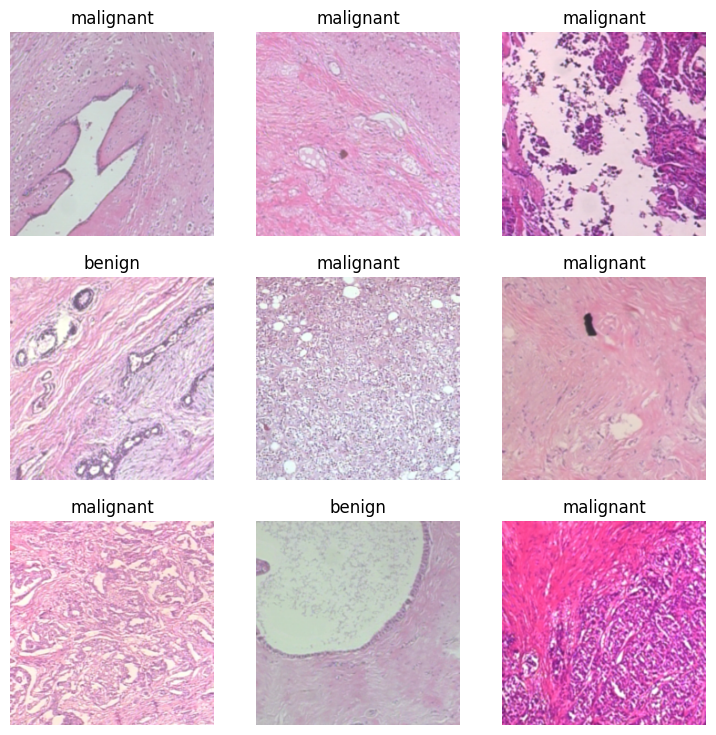

In [ ]:
#Importing and preparing data

!curl -s https://course.fast.ai/setup/colab | bash

from google.colab import drive
from fastai.vision.all import *

drive.mount('/content/drive')

path_breastcancer = "/content/drive/MyDrive/Colab Notebooks/Breast_Cancer_Dataset"

path = Path(path_breastcancer)

# using the DataBlock API
data = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.3),
    item_tfms=Resize(224),
    #batch_tfms=aug_transforms(do_flip=True, flip_vert=True)
)

# Creating DataLoaders
dls = data.dataloaders(path, bs=64)

# visualize
dls.show_batch(max_n=9)




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from fastai import *
from fastai.vision import *

Classifier 3: Custom CNN (4 blocks + connected layer)

In [ ]:
# data prep

data_cnn = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.3),
    item_tfms=Resize(224),

)

dls_2 = data_cnn.dataloaders(path, bs=32)


In [ ]:
# cnn model implementation

import torch.nn as nn
import torch.nn.functional as F

class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        self.conv_block1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        # Fully connected layers with Dropout
        self.fc1 = nn.Linear(256 * 14 * 14, 512)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, 2)

    def forward(self, x):
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.conv_block4(x)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x


In [ ]:
# training the model

model = CustomCNN()

loss_func = CrossEntropyLossFlat()

c3 = Learner(
    dls_2,
    model,
    loss_func=CrossEntropyLossFlat(),
    metrics=[accuracy, Precision(), Recall()]
)



In [ ]:
c3.fit_one_cycle(10, lr_max=1e-5)

epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.601461,0.572188,0.700669,0.695502,0.992593,01:59
1,0.506640,0.428549,0.819398,0.859564,0.876543,00:07
2,0.454047,0.396382,0.842809,0.859122,0.918519,00:07
3,0.454210,0.385705,0.847826,0.829832,0.975309,00:07
4,0.409127,0.359549,0.852843,0.839400,0.967901,00:07
5,0.391322,0.341448,0.869565,0.860927,0.962963,00:07
6,0.367860,0.332411,0.856187,0.886199,0.903704,00:07
7,0.356131,0.318730,0.874582,0.873303,0.953086,00:07
8,0.340954,0.322487,0.876254,0.875283,0.953086,00:07
9,0.335012,0.323055,0.867893,0.877315,0.935802,00:07


In [ ]:
preds, y_true = c3.get_preds()
y_pred = preds.argmax(dim=1)



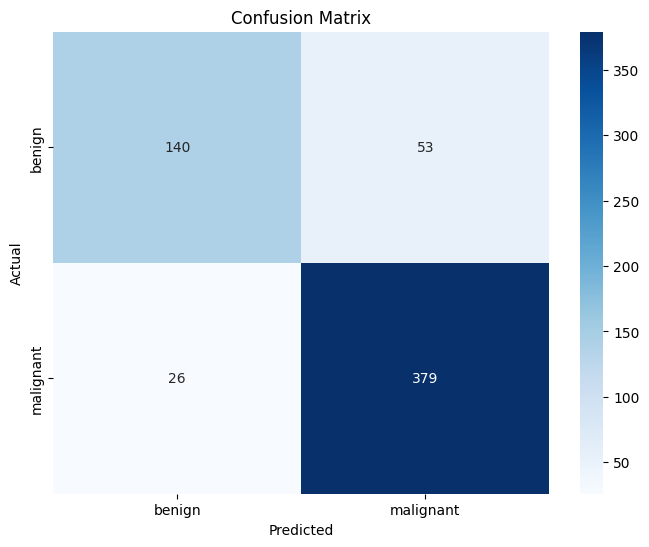

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate predictions for validation set
preds, y_true = c3.get_preds(ds_idx=1)  # Assuming c3 is the CNN Learner
y_pred = preds.argmax(dim=1).numpy()   # Predicted class labels
y_true = y_true.numpy()                # True labels

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=dls_2.vocab, yticklabels=dls_2.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()



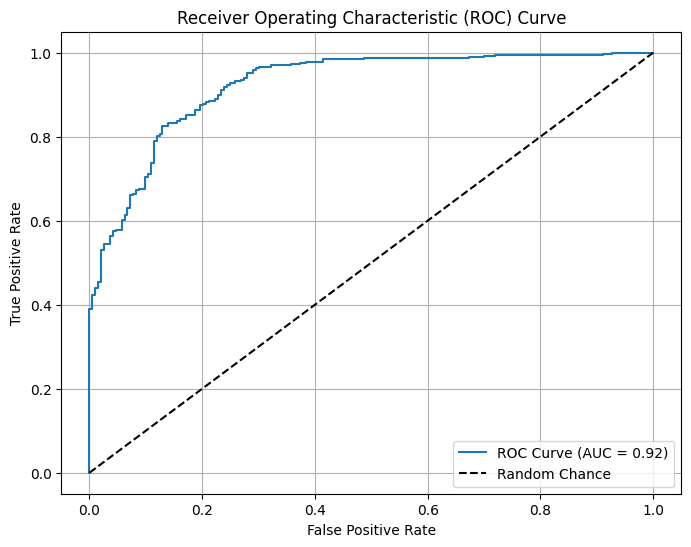

In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Get predictions and true labels
preds, y_true = c3.get_preds()

# Ensure it's a binary classification problem
if preds.shape[1] == 2:
    y_probs = preds[:, 1]  # Probabilities for the positive class

    # Compute ROC curve and AUC
    fpr, tpr, thresholds = roc_curve(y_true, y_probs)
    roc_auc = roc_auc_score(y_true, y_probs)

    # Plot ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], 'k--', label="Random Chance")  # Diagonal line
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver Operating Characteristic (ROC) Curve")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()
else:
    print("ROC curve is only applicable for binary classification.")


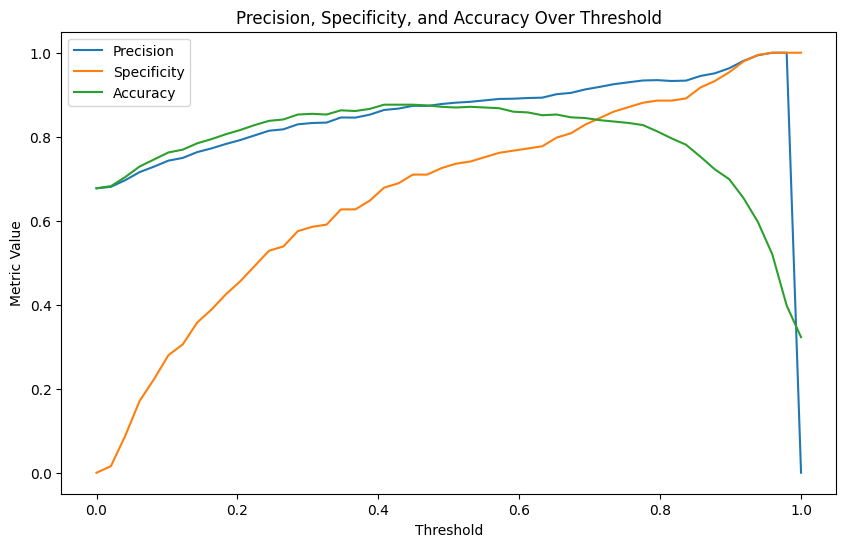

In [ ]:
from sklearn.metrics import precision_score, recall_score

# Initialize lists to store metrics at each threshold
thresholds = np.linspace(0, 1, 50)  # Generate 50 thresholds between 0 and 1
precision_list = []
specificity_list = []
accuracy_list = []

# Iterate through thresholds
for threshold in thresholds:
    y_pred_binary = (preds[:, 1] > threshold).int().numpy()  # Threshold predictions
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred_binary).ravel()

    # Calculate precision, specificity, and accuracy
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    accuracy = (tp + tn) / (tp + tn + fp + fn)

    precision_list.append(precision)
    specificity_list.append(specificity)
    accuracy_list.append(accuracy)

# Plot Precision, Specificity, and Accuracy Over Threshold
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precision_list, label="Precision")
plt.plot(thresholds, specificity_list, label="Specificity")
plt.plot(thresholds, accuracy_list, label="Accuracy")
plt.xlabel('Threshold')
plt.ylabel('Metric Value')
plt.title('Precision, Specificity, and Accuracy Over Threshold')
plt.legend()
plt.show()


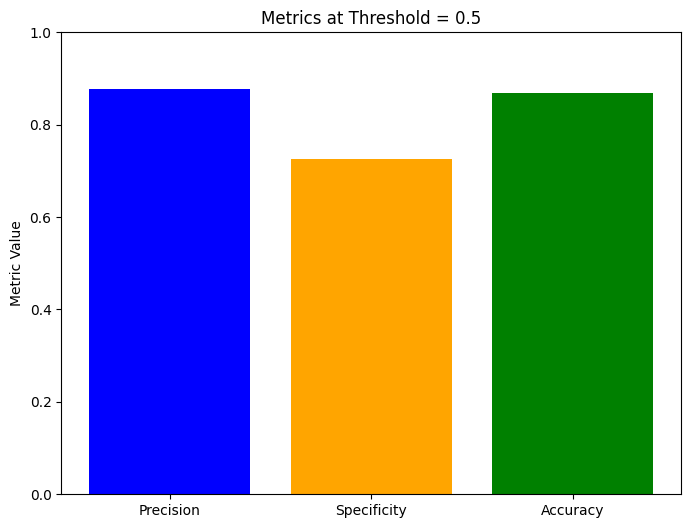

In [ ]:
# Choose a threshold (e.g., 0.5) and calculate metrics
chosen_threshold = 0.5
y_pred_binary = (preds[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true, y_pred_binary).ravel()

precision = tp / (tp + fp) if (tp + fp) > 0 else 0
specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
accuracy = (tp + tn) / (tp + tn + fp + fn)

# Prepare data for bar chart
metrics = ['Precision', 'Specificity', 'Accuracy']
values = [precision, specificity, accuracy]

# Plot bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics, values, color=['blue', 'orange', 'green'])
plt.ylim(0, 1)  # Set y-axis limit to 0-1
plt.ylabel('Metric Value')
plt.title(f'Metrics at Threshold = {chosen_threshold}')
plt.show()


True Label: malignant (Index: TensorCategory(1))
Predicted Label: malignant (Index: 1)
Probabilities:
  benign: 0.3202
  malignant: 0.6798


<Axes: title={'center': 'True: malignant | Predicted: malignant'}>

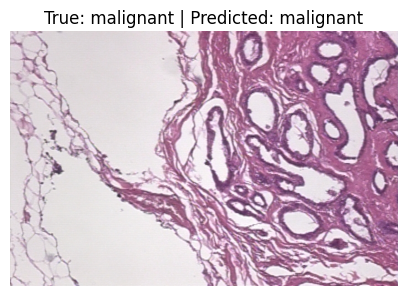

In [ ]:
# Get a sample image and its true label
img, true_label = dls_2.valid_ds[0]  # Assuming dls_2 corresponds to CNN DataLoader

# Make a prediction
prediction = c3.predict(img)

# Extract prediction details
predicted_label = prediction[0]
predicted_index = prediction[1]
probabilities = prediction[2]

# Map true label index to string
true_label_str = dls_2.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label} (Index: {predicted_index.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities):
    label = dls_2.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label}")


Classifier 2: Simple Neural Network (2 Hidden Layers)

In [ ]:
# resize images to 64x64 pixels to ensure compatibility with our neural network.

data_nn = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.3),
    item_tfms=Resize(64),
    batch_tfms=aug_transforms(do_flip=True, flip_vert=True)
)

get_y = parent_label,
item_tfms = [Resize(64)],
batch_tfms = [aug_transforms(do_flip=True, flip_vert=True), IntToFloatTensor()],

dls_1 = data_nn.dataloaders(path, bs=32)


In [ ]:
# defining the model

class SimpleNet(nn.Module):
    def __init__(self):
        super(SimpleNet, self).__init__()
        self.fc1 = nn.Linear(64*64*3, 128)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 2)

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

model = SimpleNet()

In [ ]:
# training the model

# loss function
loss_func = CrossEntropyLossFlat()

from fastai.metrics import accuracy, Precision, Recall

# Create the learner with additional metrics
c2 = Learner(
    dls_1,
    model,
    loss_func=CrossEntropyLossFlat(),
    metrics=[accuracy, Precision(average='micro'), Recall(average='micro')]
)


In [ ]:
c2.fit_one_cycle(10, lr_max=1e-4)

epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.583976,0.577829,0.692308,0.692308,0.692308,00:07
1,0.578070,0.595724,0.692308,0.692308,0.692308,00:07
2,0.565465,0.543430,0.775920,0.775920,0.775920,00:07
3,0.550141,0.533023,0.693980,0.693980,0.693980,00:07
4,0.535358,0.520912,0.734114,0.734114,0.734114,00:07
5,0.523767,0.526778,0.814381,0.814381,0.814381,00:07
6,0.518152,0.513081,0.807692,0.807692,0.807692,00:07
7,0.510904,0.515008,0.819398,0.819398,0.819398,00:07
8,0.508960,0.515039,0.821070,0.821070,0.821070,00:07
9,0.508906,0.513463,0.817726,0.817726,0.817726,00:07


In [ ]:
preds, y_true = c2.get_preds()
y_pred = preds.argmax(dim=1)


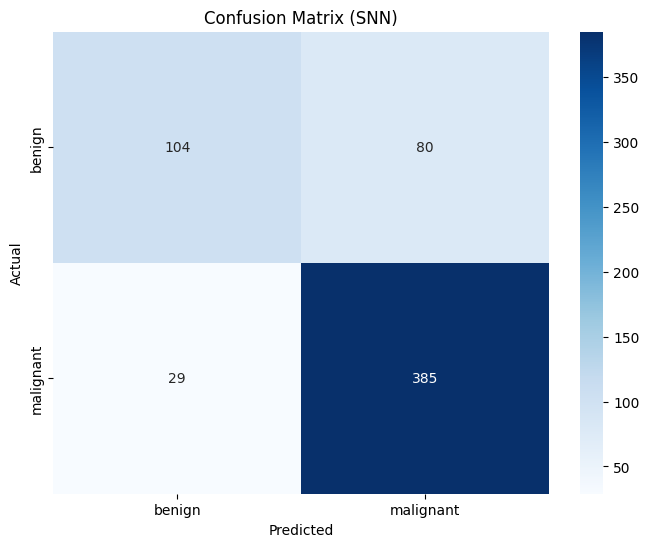

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate predictions for validation set
preds, y_true = c2.get_preds(ds_idx=1)  # Assuming c2 is the SNN Learner
y_pred = preds.argmax(dim=1).numpy()   # Predicted class labels
y_true = y_true.numpy()                # True labels

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=dls_1.vocab, yticklabels=dls_1.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (SNN)')
plt.show()


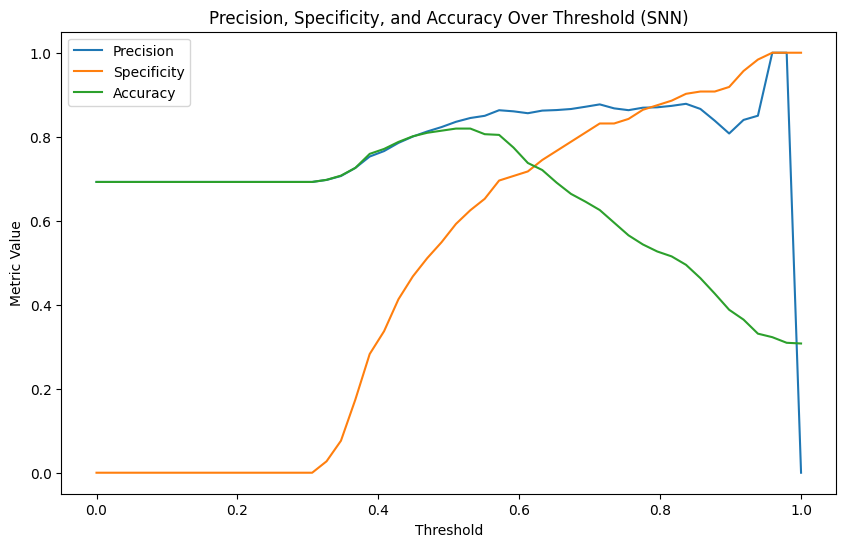

In [ ]:
# Initialize lists to store metrics at each threshold
thresholds = np.linspace(0, 1, 50)  # Generate 50 thresholds between 0 and 1
precision_list = []
specificity_list = []
accuracy_list = []

# Iterate through thresholds
for threshold in thresholds:
    y_pred_binary = (preds[:, 1] > threshold).int().numpy()  # Threshold predictions
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred_binary).ravel()

    # Calculate precision, specificity, and accuracy
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    accuracy = (tp + tn) / (tp + tn + fp + fn)

    precision_list.append(precision)
    specificity_list.append(specificity)
    accuracy_list.append(accuracy)

# Plot Precision, Specificity, and Accuracy Over Threshold
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precision_list, label="Precision")
plt.plot(thresholds, specificity_list, label="Specificity")
plt.plot(thresholds, accuracy_list, label="Accuracy")
plt.xlabel('Threshold')
plt.ylabel('Metric Value')
plt.title('Precision, Specificity, and Accuracy Over Threshold (SNN)')
plt.legend()
plt.show()


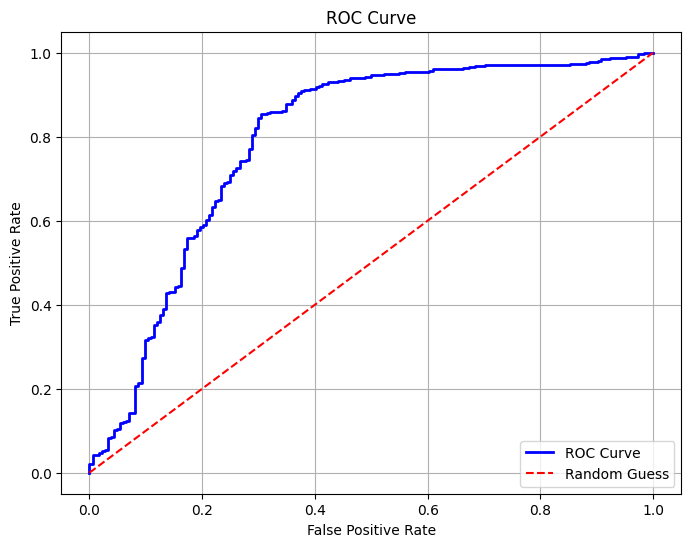

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

# Get predictions and targets
preds, targs = c2.get_preds()

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(targs.cpu().numpy(), preds[:, 1].cpu().numpy())

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label="ROC Curve")
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.grid()
plt.show()


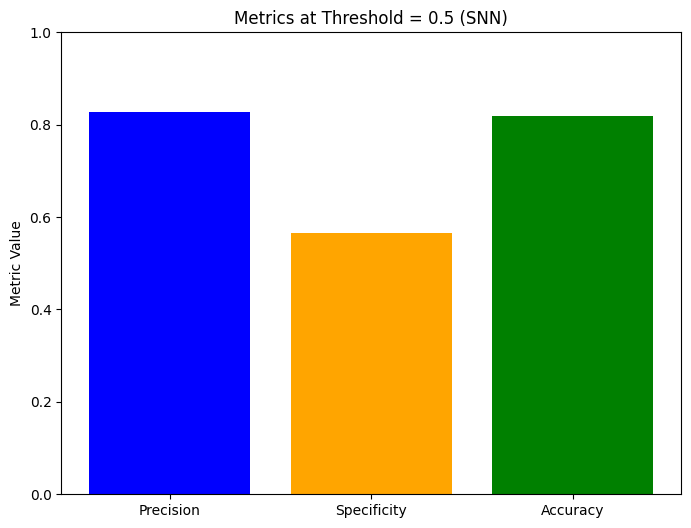

In [ ]:
# Choose a threshold (e.g., 0.5) and calculate metrics
chosen_threshold = 0.5
y_pred_binary = (preds[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true, y_pred_binary).ravel()

precision = tp / (tp + fp) if (tp + fp) > 0 else 0
specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
accuracy = (tp + tn) / (tp + tn + fp + fn)

# Prepare data for bar chart
metrics = ['Precision', 'Specificity', 'Accuracy']
values = [precision, specificity, accuracy]

# Plot bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics, values, color=['blue', 'orange', 'green'])
plt.ylim(0, 1)  # Set y-axis limit to 0-1
plt.ylabel('Metric Value')
plt.title(f'Metrics at Threshold = {chosen_threshold} (SNN)')
plt.show()


True Label: malignant (Index: TensorCategory(1))
Predicted Label: malignant (Index: 1)
Probabilities:
  benign: 0.3812
  malignant: 0.6188


<Axes: title={'center': 'True: malignant | Predicted: malignant'}>

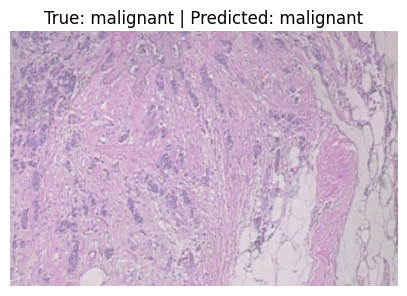

In [ ]:
# Get a sample image and its true label
img, true_label = dls_1.valid_ds[0]  # Assuming dls_1 corresponds to SNN DataLoader

# Make a prediction
prediction = c2.predict(img)

# Extract prediction details
predicted_label = prediction[0]
predicted_index = prediction[1]
probabilities = prediction[2]

# Map true label index to string
true_label_str = dls_1.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label} (Index: {predicted_index.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities):
    label = dls_1.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label}")


In [ ]:
# Calculate metrics
tn, fp, fn, tp = cm.ravel()

precision = tp / (tp + fp)
recall = tp / (tp + fn)        # Sensitivity
specificity = tn / (tn + fp)
f1_score = 2 * (precision * recall) / (precision + recall)

print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"F1 Score: {f1_score:.4f}")

Precision: 0.8135
Recall (Sensitivity): 0.9452
Specificity: 0.4888
F1 Score: 0.8744


VGG16 Model

In [ ]:
from torchvision.models import vgg16
import torch.nn as nn


In [ ]:
# Load pretrained VGG16 model
class VGG16FineTuned(nn.Module):
    def __init__(self):
        super(VGG16FineTuned, self).__init__()
        self.vgg16 = vgg16(pretrained=True)

        # Modify the classifier to match binary classification (2 classes)
        self.vgg16.classifier[6] = nn.Linear(4096, 2)

    def forward(self, x):
        return self.vgg16(x)

# Initialize the model
vgg16_model = VGG16FineTuned()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 224MB/s]


In [ ]:
from fastai.metrics import accuracy, Precision, Recall

# Define the learner with appropriate metrics
c4 = Learner(
    dls_2,
    vgg16_model,
    loss_func=loss_func,
    metrics=[
        accuracy,
        Precision(average='micro'),  # Adjust for binary classification
        Recall(average='micro')      # Adjust for binary classification
    ]
)


In [ ]:
c4.fit_one_cycle(10, lr_max=1e-4)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.407224,0.294383,0.879599,0.879599,0.879599,00:08
1,0.332975,0.292555,0.891304,0.891304,0.891304,00:08
2,0.273895,0.324383,0.887960,0.887960,0.887960,00:08
3,0.191892,0.110151,0.959866,0.959866,0.959866,00:07
4,0.133115,0.150686,0.944816,0.944816,0.944816,00:08
5,0.090393,0.274967,0.892977,0.892977,0.892977,00:07
6,0.050380,0.083833,0.969900,0.969900,0.969900,00:08
7,0.022980,0.074605,0.973244,0.973244,0.973244,00:08
8,0.010665,0.083210,0.976589,0.976589,0.976589,00:07
9,0.005436,0.083284,0.976589,0.976589,0.976589,00:08


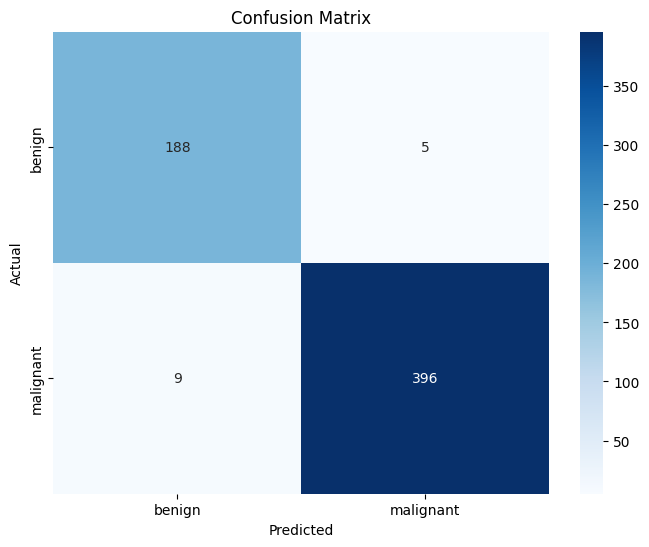

Classification Report:
               precision    recall  f1-score   support

      benign       0.95      0.97      0.96       193
   malignant       0.99      0.98      0.98       405

    accuracy                           0.98       598
   macro avg       0.97      0.98      0.97       598
weighted avg       0.98      0.98      0.98       598



In [ ]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt

# Get predictions
preds, y_true = c4.get_preds()
y_pred = preds.argmax(dim=1)

# Convert tensors to NumPy arrays for compatibility with sklearn
y_true = y_true.numpy()
y_pred = y_pred.numpy()

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=dls_2.vocab, yticklabels=dls_2.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Classification report
print("Classification Report:\n", classification_report(y_true, y_pred, target_names=dls_2.vocab))


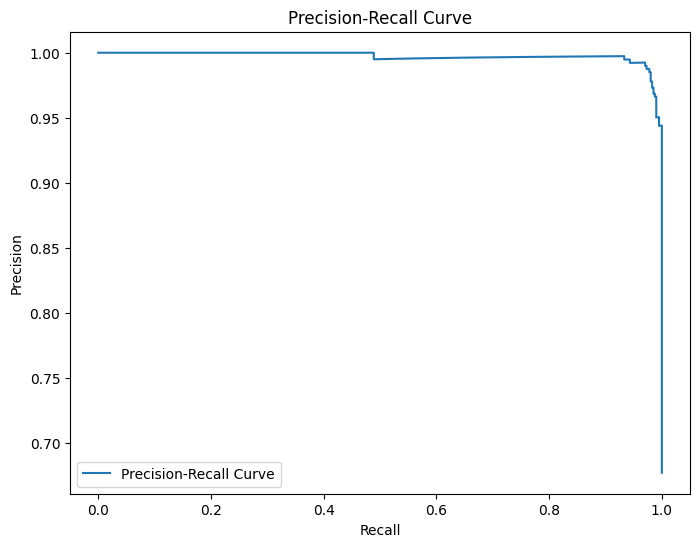

In [ ]:
from sklearn.metrics import precision_recall_curve

# Calculate precision-recall values
precision, recall, thresholds = precision_recall_curve(y_true, preds[:, 1])  # Use probability of the positive class

# Plot Precision-Recall curve
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label="Precision-Recall Curve")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall Curve")
plt.legend()
plt.show()


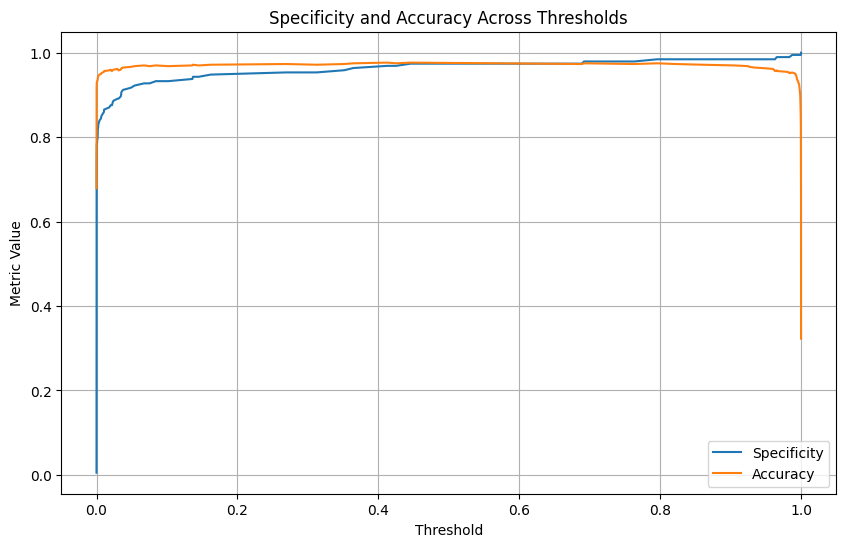

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Convert PyTorch tensors to NumPy arrays if necessary
if isinstance(y_true, torch.Tensor):
    y_true = y_true.cpu().numpy()
if isinstance(preds, torch.Tensor):
    preds = preds.cpu().numpy()

# Initialize lists to store metrics
specificity = []
accuracy = []

# Iterate through thresholds
for threshold in thresholds:
    # Convert predictions to binary using the threshold
    y_pred_binary = (preds[:, 1] > threshold).astype(int)  # Use `.astype(int)` for NumPy arrays

    # Compute confusion matrix
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred_binary).ravel()

    # Calculate specificity and accuracy
    specificity.append(tn / (tn + fp))
    accuracy.append((tp + tn) / (tp + tn + fp + fn))

# Plot Specificity, Precision, and Accuracy
plt.figure(figsize=(10, 6))
plt.plot(thresholds, specificity, label="Specificity")
plt.plot(thresholds, accuracy, label="Accuracy")
plt.xlabel("Threshold")
plt.ylabel("Metric Value")
plt.title("Specificity and Accuracy Across Thresholds")
plt.legend()
plt.grid()
plt.show()


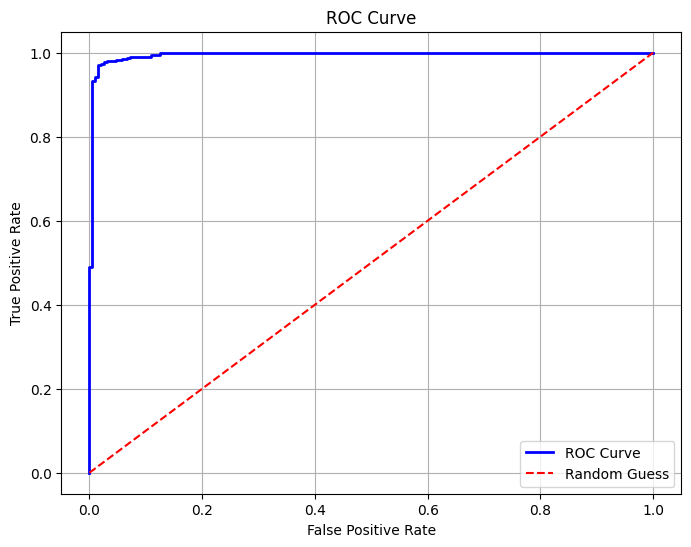

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

# Ensure y_true and preds are NumPy arrays
if isinstance(y_true, torch.Tensor):
    y_true = y_true.cpu().numpy()
if isinstance(preds, torch.Tensor):
    preds = preds.cpu().numpy()

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_true, preds[:, 1])  # Use the positive class probabilities

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label="ROC Curve")
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.grid()
plt.show()


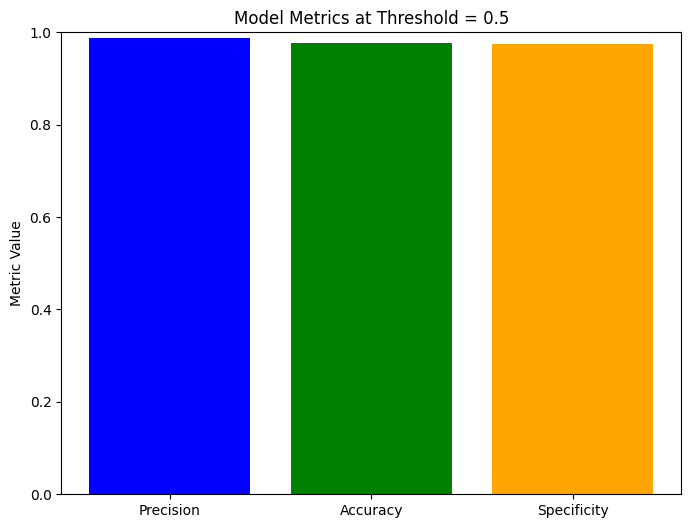

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Ensure y_true and preds are NumPy arrays
if isinstance(y_true, torch.Tensor):
    y_true = y_true.cpu().numpy()
if isinstance(preds, torch.Tensor):
    preds = preds.cpu().numpy()

# Calculate the metrics for a chosen threshold
chosen_threshold = 0.5  # Adjust this as needed
y_pred_binary = (preds[:, 1] > chosen_threshold).astype(int)  # Convert to NumPy int

# Compute confusion matrix
tn, fp, fn, tp = confusion_matrix(y_true, y_pred_binary).ravel()

# Compute metrics
precision_value = tp / (tp + fp) if (tp + fp) > 0 else 0  # Avoid division by zero
accuracy_value = (tp + tn) / (tp + tn + fp + fn)
specificity_value = tn / (tn + fp) if (tn + fp) > 0 else 0  # Avoid division by zero

# Prepare data for bar graph
metrics = ['Precision', 'Accuracy', 'Specificity']
values = [precision_value, accuracy_value, specificity_value]

# Plot bar graph
plt.figure(figsize=(8, 6))
plt.bar(metrics, values, color=['blue', 'green', 'orange'])
plt.ylim(0, 1)  # Set y-axis limit to 0-1
plt.ylabel("Metric Value")
plt.title(f"Model Metrics at Threshold = {chosen_threshold}")
plt.show()


In [ ]:
# Use get_preds to get predictions and true labels
preds, y_true = c4.get_preds(ds_idx=1)  # ds_idx=1 specifies validation dataset
y_pred = preds.argmax(dim=1).numpy()   # Convert predicted probabilities to class labels
y_true = y_true.numpy()                # Convert true labels to NumPy array

# Compute confusion matrix elements
from sklearn.metrics import confusion_matrix

tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

# Calculate metrics
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
recall = tp / (tp + fn) if (tp + fn) > 0 else 0  # Sensitivity
specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

# Print metrics
print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"F1 Score: {f1_score:.4f}")


Precision: 0.9875
Recall (Sensitivity): 0.9778
Specificity: 0.9741
F1 Score: 0.9826


True Label: malignant (Index: TensorCategory(1))
Predicted Label: malignant (Index: 1)
Probabilities:
  benign: 0.0000
  malignant: 1.0000


<Axes: title={'center': 'True: malignant | Predicted: malignant'}>

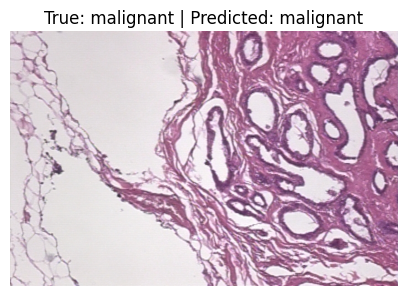

In [ ]:
# Get a sample image and its true label
img, true_label = dls_2.valid_ds[0]  # Use dls_2 since it corresponds to VGG16 (224x224 images)

# Make a prediction using VGG16 Learner
prediction = c4.predict(img)

# Extract prediction details
predicted_label = prediction[0]
predicted_index = prediction[1]
probabilities = prediction[2]

if isinstance(predicted_label, list):
    predicted_label = predicted_label[0]

# Map the true label index to its string representation
true_label_str = dls_2.vocab[true_label]

# Print the results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label} (Index: {predicted_index.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities):
    label = dls_2.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with the prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label}")


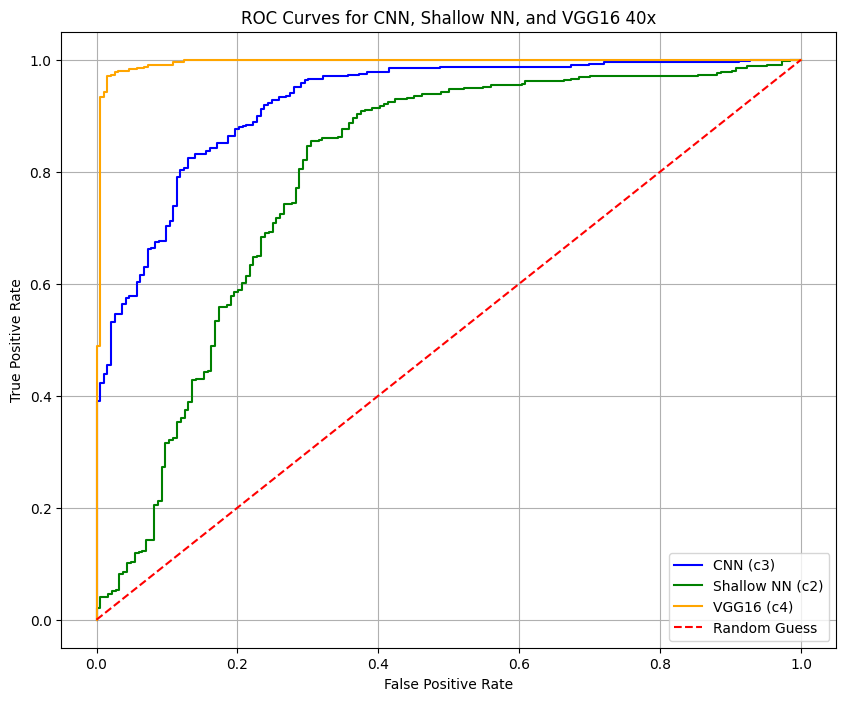

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt
import torch

# Function to convert tensors to NumPy arrays if needed
def ensure_numpy(tensor):
    return tensor.cpu().numpy() if isinstance(tensor, torch.Tensor) else tensor

# Function to compute ROC curve
def compute_roc(y_true, preds):
    y_true = ensure_numpy(y_true)
    preds = ensure_numpy(preds)
    fpr, tpr, _ = roc_curve(y_true, preds[:, 1])  # Use positive class probabilities
    return fpr, tpr

# Get predictions and true labels for each model
# CNN
preds_cnn, y_true_cnn = c3.get_preds()
# Shallow NN
preds_shallow, y_true_shallow = c2.get_preds()
# VGG16
preds_vgg, y_true_vgg = c4.get_preds()

# Compute ROC curves
fpr_cnn, tpr_cnn = compute_roc(y_true_cnn, preds_cnn)
fpr_shallow, tpr_shallow = compute_roc(y_true_shallow, preds_shallow)
fpr_vgg, tpr_vgg = compute_roc(y_true_vgg, preds_vgg)

# Plot ROC curves
plt.figure(figsize=(10, 8))
plt.plot(fpr_cnn, tpr_cnn, label="CNN (c3)", color='blue')
plt.plot(fpr_shallow, tpr_shallow, label="Shallow NN (c2)", color='green')
plt.plot(fpr_vgg, tpr_vgg, label="VGG16 (c4)", color='orange')

# Add a random guess diagonal line
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")

# Configure the plot
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for CNN, Shallow NN, and VGG16 40x")
plt.legend(loc="lower right")
plt.grid()
plt.show()


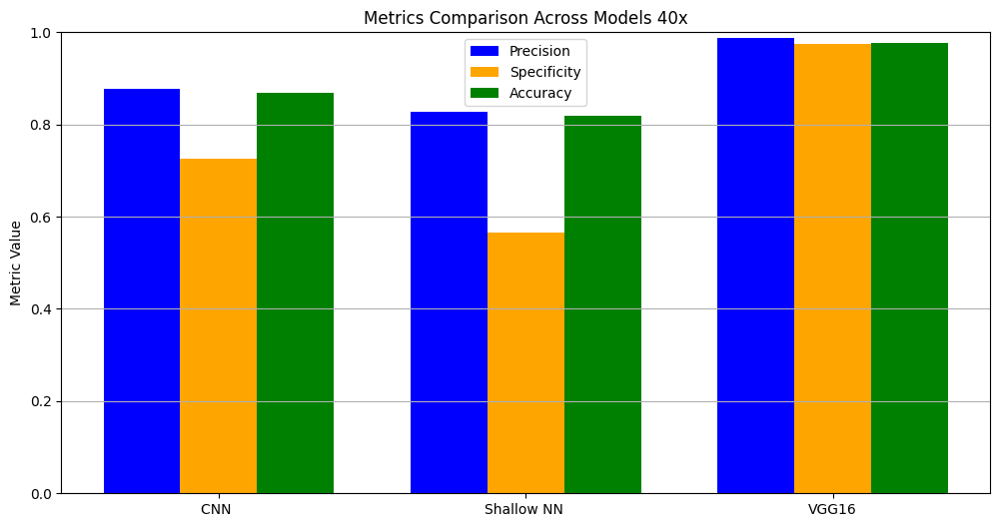

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Function to calculate metrics
def calculate_metrics(y_true, preds, threshold=0.5):
    # Convert to NumPy if necessary
    y_true = y_true.cpu().numpy() if isinstance(y_true, torch.Tensor) else y_true
    preds = preds.cpu().numpy() if isinstance(preds, torch.Tensor) else preds

    # Apply threshold and compute confusion matrix
    y_pred_binary = (preds[:, 1] > threshold).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred_binary).ravel()

    # Calculate metrics
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    accuracy = (tp + tn) / (tp + tn + fp + fn)

    return precision, specificity, accuracy

# Metrics for each model
models = {
    "CNN ": (y_true_cnn, preds_cnn),
    "Shallow NN ": (y_true_shallow, preds_shallow),
    "VGG16": (y_true_vgg, preds_vgg),
}

# Store metrics
metrics_values = {"Precision": [], "Specificity": [], "Accuracy": []}

# Compute metrics for all models
for model_name, (y_true, preds) in models.items():
    precision, specificity, accuracy = calculate_metrics(y_true, preds)
    metrics_values["Precision"].append(precision)
    metrics_values["Specificity"].append(specificity)
    metrics_values["Accuracy"].append(accuracy)

# Bar chart for all models
x = np.arange(len(models))  # Model indices
width = 0.25  # Width of each bar

# Plot metrics
plt.figure(figsize=(12, 6))
plt.bar(x - width, metrics_values["Precision"], width, label="Precision", color='blue')
plt.bar(x, metrics_values["Specificity"], width, label="Specificity", color='orange')
plt.bar(x + width, metrics_values["Accuracy"], width, label="Accuracy", color='green')

# Configure plot
plt.xticks(x, models.keys())  # Model names as x-ticks
plt.ylim(0, 1)
plt.ylabel("Metric Value")
plt.title("Metrics Comparison Across Models 40x")
plt.legend()
plt.grid(axis='y')
plt.show()


WITH AUGMENTATIONS

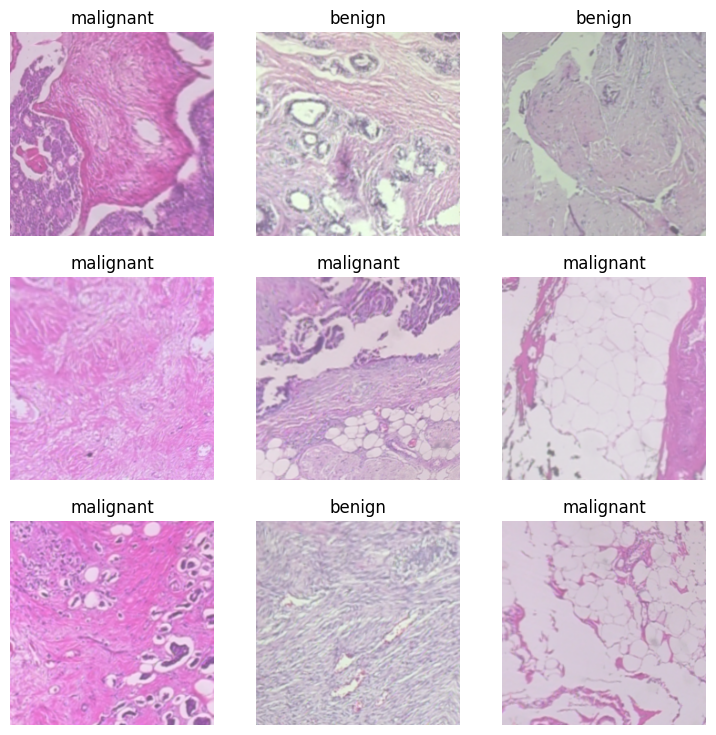

In [ ]:
from fastai.vision.augment import aug_transforms

# DataBlock with augmentations (no rotation) compatible with the old CNN
data_augmented_cnn = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.3),
    item_tfms=Resize(224),  # Ensure final image size is 224x224
    batch_tfms=aug_transforms(do_flip=True, max_lighting=0.2)  # Augmentations without rotation
)

# Create DataLoaders
dls_augmented_cnn = data_augmented_cnn.dataloaders(path, bs=64)

# Visualize augmented images
dls_augmented_cnn.show_batch(max_n=9)


In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        self.conv_block1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        # Dynamically calculate the flattened size
        with torch.no_grad():
            dummy_input = torch.zeros(1, 3, 224, 224)  # Dummy input with 224x224
            flattened_size = self._get_flattened_size(dummy_input)

        # Fully connected layers
        self.fc1 = nn.Linear(flattened_size, 512)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, 2)

    def _get_flattened_size(self, x):
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.conv_block4(x)
        return x.view(x.size(0), -1).size(1)

    def forward(self, x):
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.conv_block4(x)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x


In [ ]:
from fastai.metrics import accuracy, Precision, Recall
from fastai.vision.augment import aug_transforms
from fastai.vision.all import CrossEntropyLossFlat, Learner

# Loss function
loss_func = CrossEntropyLossFlat()

# Define the learner
c3_aug_cnn = Learner(
    dls_augmented_cnn,  # DataLoaders with augmentations
    model=CustomCNN(),  # The custom CNN model
    loss_func=loss_func,
    metrics=[accuracy, Precision(average='micro'), Recall(average='micro')]  # Metrics
)

# Train the model
c3_aug_cnn.fit_one_cycle(10, lr_max=1e-5)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.717209,0.625106,0.678930,0.678930,0.678930,00:08
1,0.610668,0.537730,0.710702,0.710702,0.710702,00:08
2,0.541726,0.424981,0.852843,0.852843,0.852843,00:08
3,0.498867,0.410924,0.824415,0.824415,0.824415,00:08
4,0.469738,0.425259,0.795987,0.795987,0.795987,00:07
5,0.453385,0.387078,0.849498,0.849498,0.849498,00:08
6,0.435248,0.386453,0.846154,0.846154,0.846154,00:08
7,0.424462,0.375450,0.861204,0.861204,0.861204,00:08
8,0.419346,0.390946,0.832776,0.832776,0.832776,00:08
9,0.413182,0.384329,0.847826,0.847826,0.847826,00:08


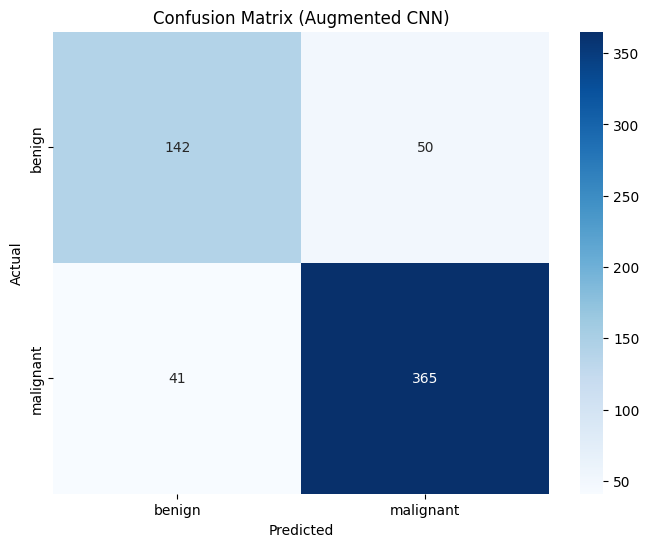

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate predictions
preds_cnn_aug, y_true_cnn_aug = c3_aug_cnn.get_preds()

# Convert predictions to class labels
y_pred_cnn_aug = preds_cnn_aug.argmax(dim=1).numpy()
y_true_cnn_aug = y_true_cnn_aug.numpy()

# Compute confusion matrix
cm = confusion_matrix(y_true_cnn_aug, y_pred_cnn_aug)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=dls_augmented_cnn.vocab, yticklabels=dls_augmented_cnn.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Augmented CNN)')
plt.show()


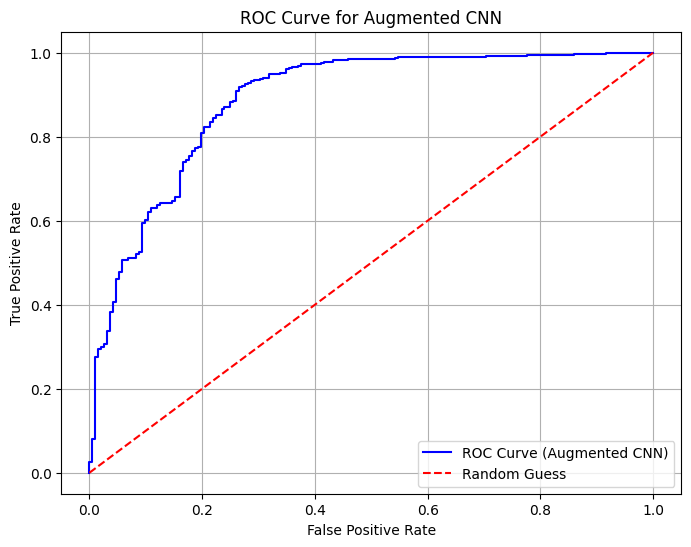

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

# Compute ROC curve
fpr, tpr, _ = roc_curve(y_true_cnn_aug, preds_cnn_aug[:, 1].numpy())

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label="ROC Curve (Augmented CNN)", color='blue')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Augmented CNN")
plt.legend(loc="lower right")
plt.grid()
plt.show()


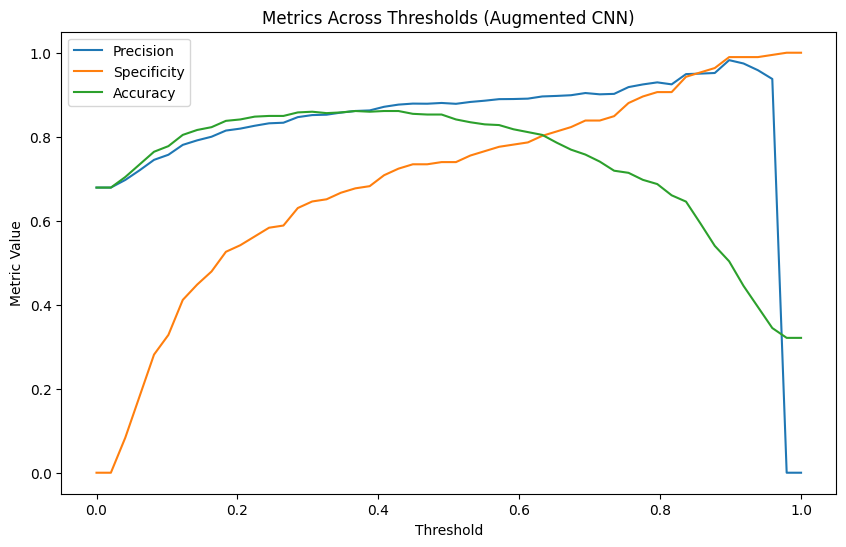

In [ ]:
import numpy as np

thresholds = np.linspace(0, 1, 50)
precision_list, specificity_list, accuracy_list = [], [], []

for threshold in thresholds:
    y_pred_binary = (preds_cnn_aug[:, 1] > threshold).int().numpy()
    tn, fp, fn, tp = confusion_matrix(y_true_cnn_aug, y_pred_binary).ravel()

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    accuracy = (tp + tn) / (tp + tn + fp + fn)

    precision_list.append(precision)
    specificity_list.append(specificity)
    accuracy_list.append(accuracy)

# Plot metrics across thresholds
plt.figure(figsize=(10, 6))
plt.plot(thresholds, precision_list, label="Precision")
plt.plot(thresholds, specificity_list, label="Specificity")
plt.plot(thresholds, accuracy_list, label="Accuracy")
plt.xlabel("Threshold")
plt.ylabel("Metric Value")
plt.title("Metrics Across Thresholds (Augmented CNN)")
plt.legend()
plt.show()


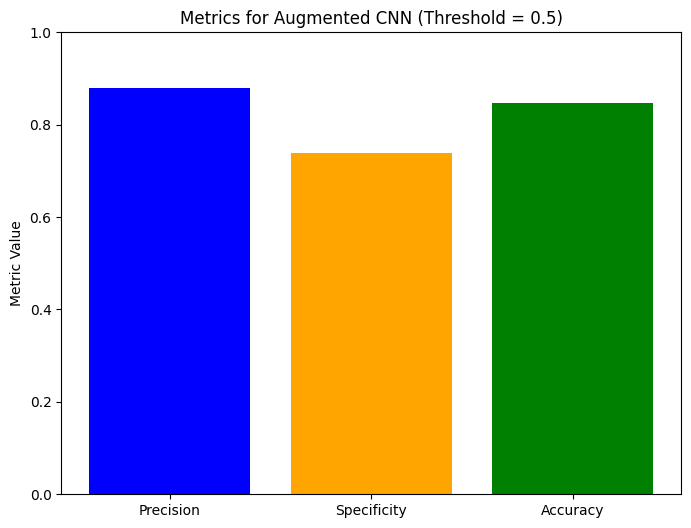

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Calculate metrics at the default threshold (0.5)
chosen_threshold = 0.5
y_pred_binary = (preds_cnn_aug[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_cnn_aug, y_pred_binary).ravel()

# Compute metrics
precision = tp / (tp + fp) if (tp + fp) > 0 else 0
specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
accuracy = (tp + tn) / (tp + tn + fp + fn)

# Prepare data for bar chart
metrics = ['Precision', 'Specificity', 'Accuracy']
values = [precision, specificity, accuracy]

# Plot bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics, values, color=['blue', 'orange', 'green'])
plt.ylim(0, 1)  # Limit y-axis to [0, 1]
plt.ylabel('Metric Value')
plt.title(f'Metrics for Augmented CNN (Threshold = {chosen_threshold})')
plt.show()


True Label: benign (Index: TensorCategory(0))
Predicted Label: benign (Index: 0)
Probabilities:
  benign: 0.5999
  malignant: 0.4001


<Axes: title={'center': 'True: benign | Predicted: benign'}>

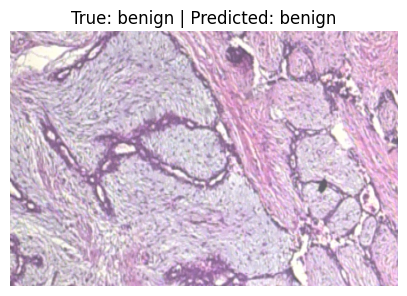

In [ ]:
# Get a sample image and its true label from the validation dataset
img, true_label = dls_augmented_cnn.valid_ds[0]  # Get the first validation sample

# Make a prediction using the trained augmented CNN
prediction = c3_aug_cnn.predict(img)

# Extract prediction details
predicted_label = prediction[0]  # Predicted class label
predicted_index = prediction[1]  # Index of the predicted class
probabilities = prediction[2]    # Probabilities for each class

# Map the true label index to its string representation
true_label_str = dls_augmented_cnn.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label} (Index: {predicted_index.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities):
    label = dls_augmented_cnn.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label}")


Shallow Neural Network (SNN) AUGMENTED

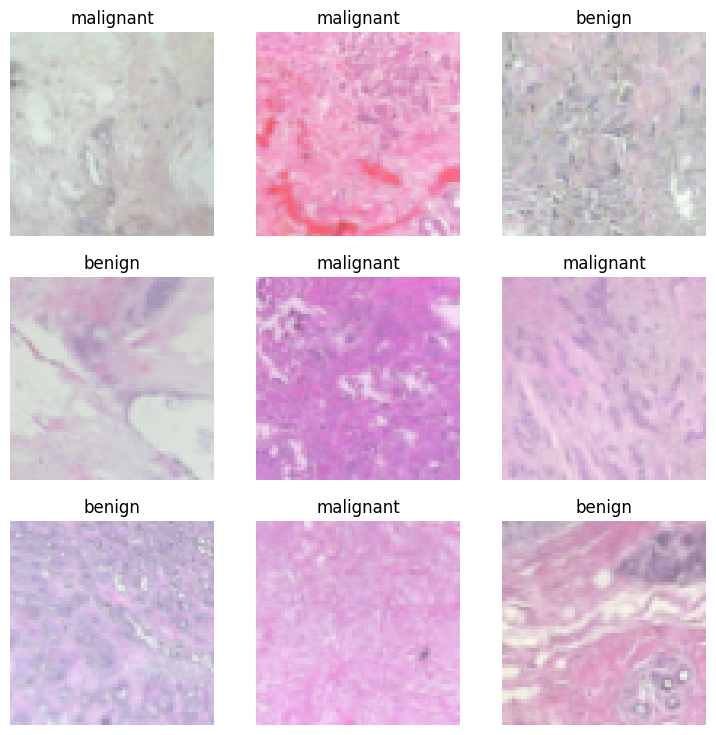

In [ ]:
# Augmented DataBlock for SNN
data_snn_augmented = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.3),
    item_tfms=Resize(64),  # Resize images to 64x64 for SNN
    batch_tfms=aug_transforms(do_flip=True, max_lighting=0.2)  # Augmentations without rotation
)

# Create DataLoaders
dls_snn_augmented = data_snn_augmented.dataloaders(path, bs=32)

# Visualize a batch of augmented images
dls_snn_augmented.show_batch(max_n=9)


In [ ]:
from fastai.metrics import accuracy, Precision, Recall
from fastai.vision.all import CrossEntropyLossFlat, Learner

# Loss function
loss_func = CrossEntropyLossFlat()

# Define the learner for the SNN model
c2_aug_snn = Learner(
    dls_snn_augmented,  # DataLoaders with augmentations resized to 64x64
    model=SimpleNet(),  # The SNN model (SimpleNet)
    loss_func=loss_func,
    metrics=[accuracy, Precision(average='micro'), Recall(average='micro')]  # Metrics
)

# Train the model
c2_aug_snn.fit_one_cycle(10, lr_max=1e-4)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.631229,0.629038,0.678930,0.678930,0.678930,00:07
1,0.622112,0.610875,0.678930,0.678930,0.678930,00:07
2,0.600277,0.591739,0.678930,0.678930,0.678930,00:08
3,0.572247,0.665053,0.678930,0.678930,0.678930,00:07
4,0.545522,0.549449,0.680602,0.680602,0.680602,00:08
5,0.528973,0.542527,0.799331,0.799331,0.799331,00:08
6,0.518271,0.516833,0.780936,0.780936,0.780936,00:08
7,0.511379,0.514859,0.780936,0.780936,0.780936,00:07
8,0.503007,0.512983,0.792642,0.792642,0.792642,00:07
9,0.498611,0.512935,0.795987,0.795987,0.795987,00:07


In [ ]:
# Generate predictions
preds_snn_aug, y_true_snn_aug = c2_aug_snn.get_preds()

# Convert predictions to class labels
y_pred_snn_aug = preds_snn_aug.argmax(dim=1).numpy()
y_true_snn_aug = y_true_snn_aug.numpy()


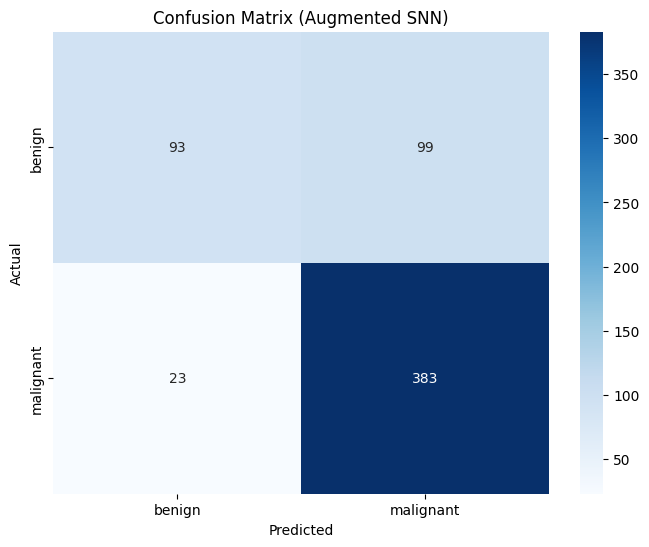

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Compute confusion matrix
cm_snn = confusion_matrix(y_true_snn_aug, y_pred_snn_aug)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_snn, annot=True, fmt='d', cmap='Blues', xticklabels=dls_snn_augmented.vocab, yticklabels=dls_snn_augmented.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Augmented SNN)')
plt.show()


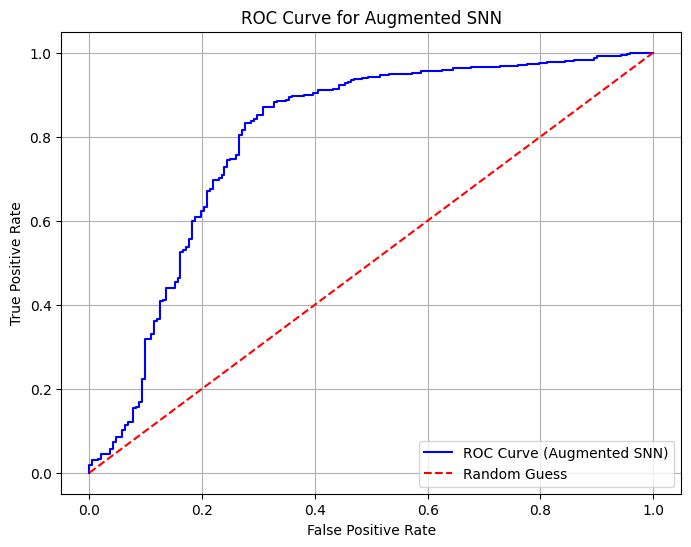

In [ ]:
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr_snn, tpr_snn, _ = roc_curve(y_true_snn_aug, preds_snn_aug[:, 1].numpy())

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_snn, tpr_snn, label="ROC Curve (Augmented SNN)", color='blue')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Augmented SNN")
plt.legend(loc="lower right")
plt.grid()
plt.show()


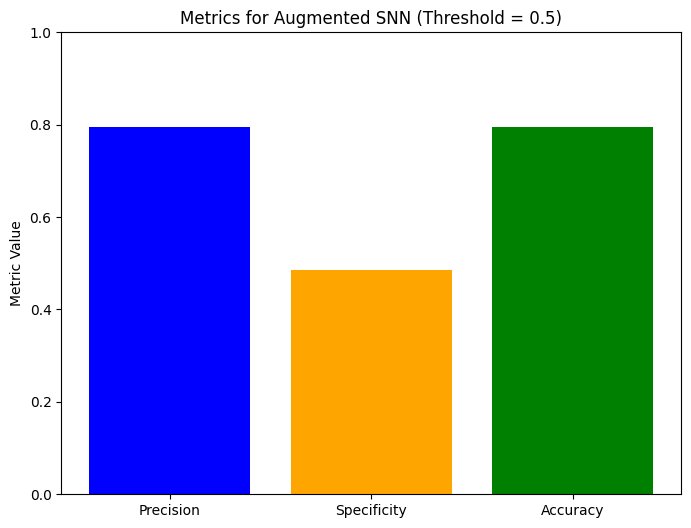

In [ ]:
# Calculate metrics at the default threshold (0.5)
chosen_threshold = 0.5
y_pred_binary_snn = (preds_snn_aug[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_snn_aug, y_pred_binary_snn).ravel()

# Compute metrics
precision_snn = tp / (tp + fp) if (tp + fp) > 0 else 0
specificity_snn = tn / (tn + fp) if (tn + fp) > 0 else 0
accuracy_snn = (tp + tn) / (tp + tn + fp + fn)

# Prepare data for bar chart
metrics_snn = ['Precision', 'Specificity', 'Accuracy']
values_snn = [precision_snn, specificity_snn, accuracy_snn]

# Plot bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics_snn, values_snn, color=['blue', 'orange', 'green'])
plt.ylim(0, 1)
plt.ylabel('Metric Value')
plt.title(f'Metrics for Augmented SNN (Threshold = {chosen_threshold})')
plt.show()


True Label: benign (Index: TensorCategory(0))
Predicted Label: benign (Index: 0)
Probabilities:
  benign: 0.5950
  malignant: 0.4050


<Axes: title={'center': 'True: benign | Predicted: benign'}>

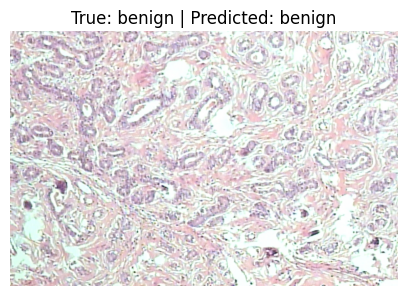

In [ ]:
# Get a sample image and its true label from the validation dataset
img, true_label = dls_snn_augmented.valid_ds[0]  # Get the first validation sample

# Make a prediction using the trained SNN
prediction = c2_aug_snn.predict(img)

# Extract prediction details
predicted_label = prediction[0]  # Predicted class label
predicted_index = prediction[1]  # Index of the predicted class
probabilities = prediction[2]    # Probabilities for each class

# Map the true label index to its string representation
true_label_str = dls_snn_augmented.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label} (Index: {predicted_index.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities):
    label = dls_snn_augmented.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label}")


VGG16 AUGMENTED

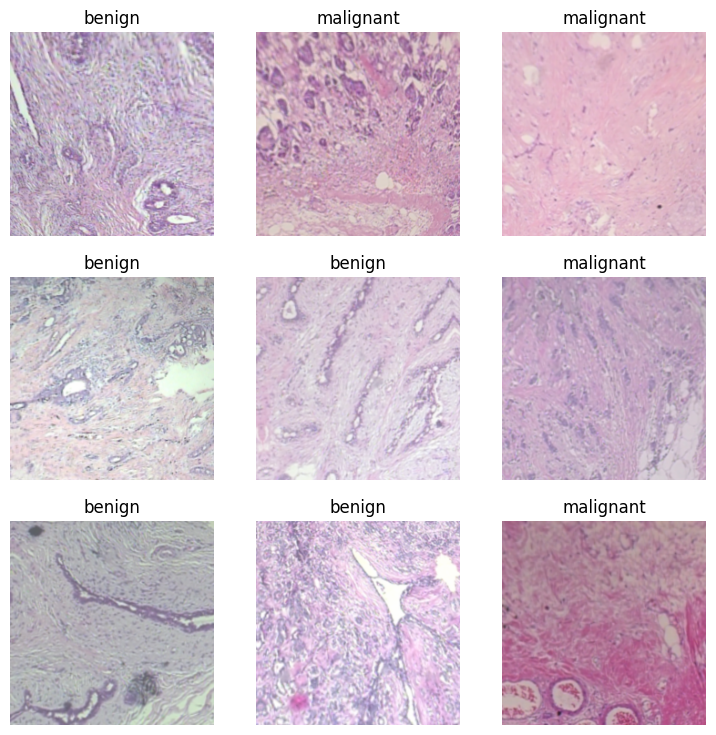

In [ ]:
# DataBlock for VGG16
data_vgg_augmented = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.3),
    item_tfms=Resize(224),  # Ensure input size is 224x224 for VGG16
    batch_tfms=aug_transforms(do_flip=True, max_lighting=0.2)  # Augmentations without rotation
)

# Create DataLoaders
dls_vgg_augmented = data_vgg_augmented.dataloaders(path, bs=32)

# Visualize a batch of augmented images
dls_vgg_augmented.show_batch(max_n=9)


In [ ]:
from torchvision.models import vgg16
import torch.nn as nn

# Load pretrained VGG16 model
class VGG16FineTuned(nn.Module):
    def __init__(self):
        super(VGG16FineTuned, self).__init__()
        self.vgg16 = vgg16(pretrained=True)

        # Modify the classifier to match binary classification (2 classes)
        self.vgg16.classifier[6] = nn.Linear(4096, 2)

    def forward(self, x):
        return self.vgg16(x)

# Initialize the model
vgg16_model = VGG16FineTuned()

# Define the learner for VGG16
c4_aug_vgg = Learner(
    dls_vgg_augmented,
    vgg16_model,
    loss_func=CrossEntropyLossFlat(),
    metrics=[accuracy, Precision(average='micro'), Recall(average='micro')]
)

# Train the model
c4_aug_vgg.fit_one_cycle(10, lr_max=1e-4)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.559898,0.406695,0.824415,0.824415,0.824415,00:08
1,0.405468,0.239194,0.908027,0.908027,0.908027,00:08
2,0.287214,0.157013,0.934783,0.934783,0.934783,00:09
3,0.228315,0.166597,0.938127,0.938127,0.938127,00:09
4,0.194530,0.198862,0.919732,0.919732,0.919732,00:08
5,0.137172,0.086888,0.969900,0.969900,0.969900,00:09
6,0.091715,0.052740,0.983278,0.983278,0.983278,00:08
7,0.062386,0.078031,0.974916,0.974916,0.974916,00:08
8,0.035203,0.063963,0.981605,0.981605,0.981605,00:08
9,0.023627,0.067453,0.981605,0.981605,0.981605,00:08


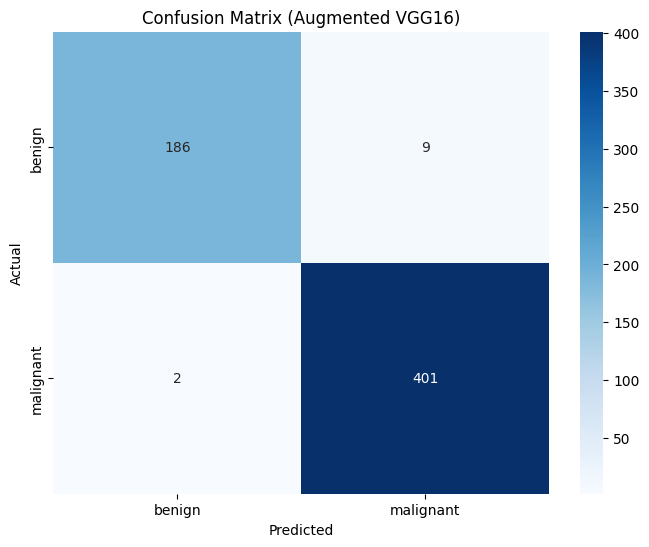

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate predictions
preds_vgg_aug, y_true_vgg_aug = c4_aug_vgg.get_preds()

# Convert predictions to class labels
y_pred_vgg_aug = preds_vgg_aug.argmax(dim=1).numpy()
y_true_vgg_aug = y_true_vgg_aug.numpy()

# Compute confusion matrix
cm_vgg = confusion_matrix(y_true_vgg_aug, y_pred_vgg_aug)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_vgg, annot=True, fmt='d', cmap='Blues', xticklabels=dls_vgg_augmented.vocab, yticklabels=dls_vgg_augmented.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Augmented VGG16)')
plt.show()


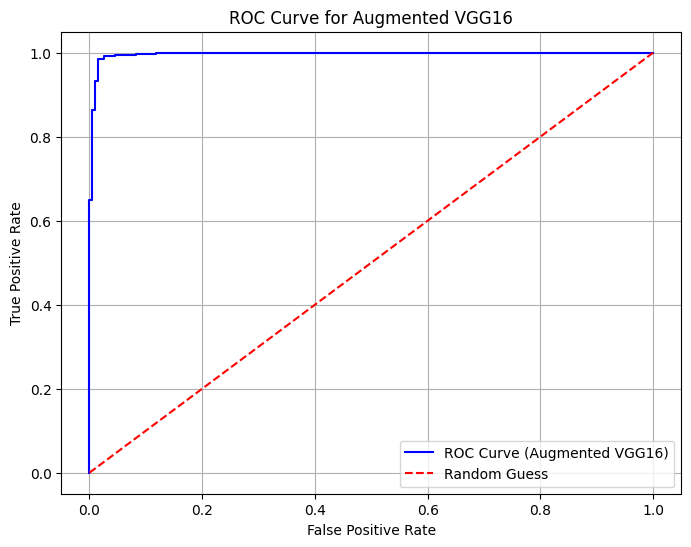

In [ ]:
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr_vgg, tpr_vgg, _ = roc_curve(y_true_vgg_aug, preds_vgg_aug[:, 1].numpy())

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_vgg, tpr_vgg, label="ROC Curve (Augmented VGG16)", color='blue')
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve for Augmented VGG16")
plt.legend(loc="lower right")
plt.grid()
plt.show()


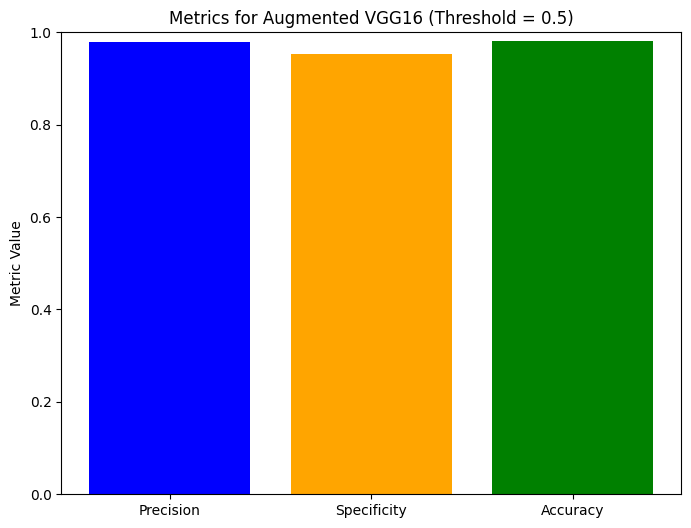

In [ ]:
# Calculate metrics at the default threshold (0.5)
chosen_threshold = 0.5
y_pred_binary_vgg = (preds_vgg_aug[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_vgg_aug, y_pred_binary_vgg).ravel()

# Compute metrics
precision_vgg = tp / (tp + fp) if (tp + fp) > 0 else 0
specificity_vgg = tn / (tn + fp) if (tn + fp) > 0 else 0
accuracy_vgg = (tp + tn) / (tp + tn + fp + fn)

# Prepare data for bar chart
metrics_vgg = ['Precision', 'Specificity', 'Accuracy']
values_vgg = [precision_vgg, specificity_vgg, accuracy_vgg]

# Plot bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics_vgg, values_vgg, color=['blue', 'orange', 'green'])
plt.ylim(0, 1)
plt.ylabel('Metric Value')
plt.title(f'Metrics for Augmented VGG16 (Threshold = {chosen_threshold})')
plt.show()


True Label: malignant (Index: TensorCategory(1))
Predicted Label: malignant (Index: 1)
Probabilities:
  benign: 0.0000
  malignant: 1.0000


<Axes: title={'center': 'True: malignant | Predicted: malignant'}>

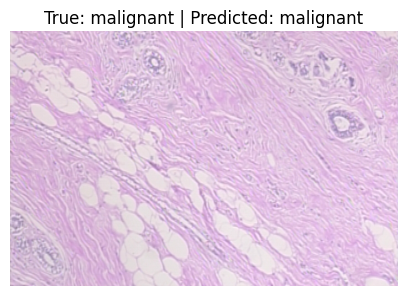

In [ ]:
# Get a sample image and its true label from the validation dataset
img, true_label = dls_vgg_augmented.valid_ds[0]  # Get the first validation sample

# Make a prediction using the trained VGG16 model
prediction = c4_aug_vgg.predict(img)

# Extract prediction details
predicted_label = prediction[0]  # Predicted class label
predicted_index = prediction[1]  # Index of the predicted class
probabilities = prediction[2]    # Probabilities for each class

# Map the true label index to its string representation
true_label_str = dls_vgg_augmented.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label} (Index: {predicted_index.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities):
    label = dls_vgg_augmented.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label}")


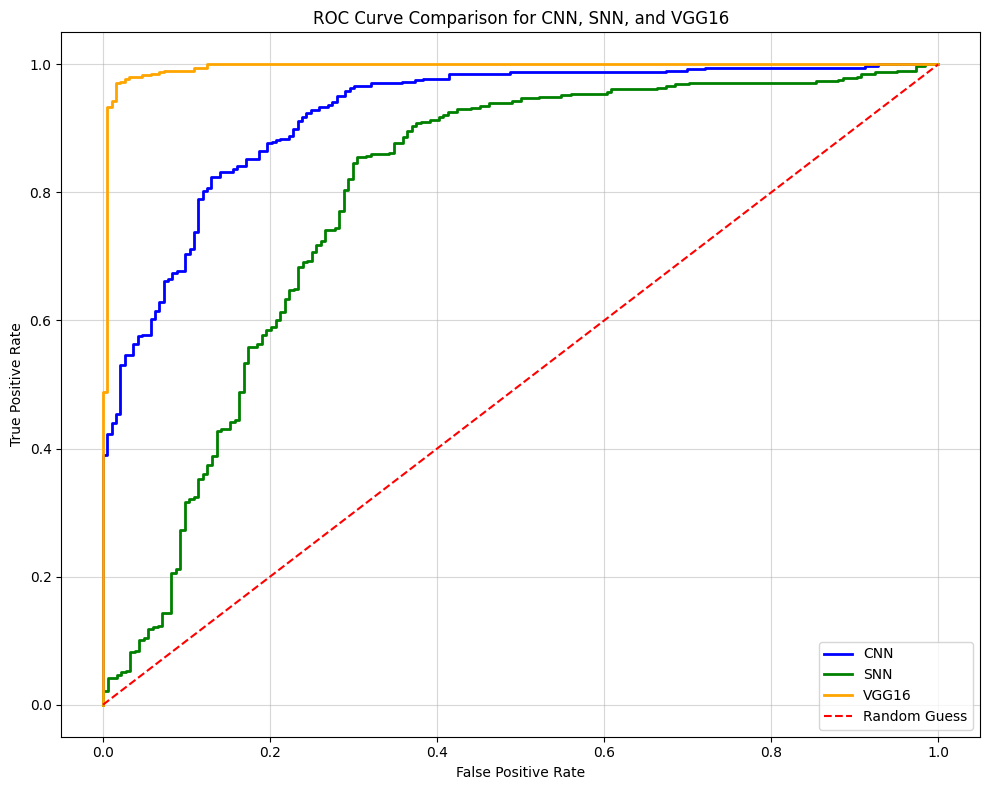

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

# Compute ROC curves for each model
fpr_cnn, tpr_cnn, _ = roc_curve(y_true_cnn, preds_cnn[:, 1].numpy())
fpr_snn, tpr_snn, _ = roc_curve(y_true_snn, preds_snn[:, 1].numpy())
fpr_vgg, tpr_vgg, _ = roc_curve(y_true_vgg, preds_vgg[:, 1].numpy())

# Plot ROC curves
plt.figure(figsize=(10, 8))

# Plot CNN
plt.plot(fpr_cnn, tpr_cnn, label="CNN", color="blue", linewidth=2)
# Plot SNN
plt.plot(fpr_snn, tpr_snn, label="SNN", color="green", linewidth=2)
# Plot VGG16
plt.plot(fpr_vgg, tpr_vgg, label="VGG16", color="orange", linewidth=2)

# Plot random guess line
plt.plot([0, 1], [0, 1], color="red", linestyle="--", label="Random Guess")

# Customize the chart
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison for CNN, SNN, and VGG16")
plt.legend(loc="lower right")
plt.grid(alpha=0.5)

# Show the chart
plt.tight_layout()
plt.show()


In [ ]:
# CNN metrics
chosen_threshold = 0.5
y_pred_binary_cnn = (preds_cnn_aug[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_cnn_aug, y_pred_binary_cnn).ravel()

accuracy_cnn_aug = (tp + tn) / (tp + tn + fp + fn)
specificity_cnn_aug = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_cnn_aug = tp / (tp + fp) if (tp + fp) > 0 else 0
# SNN metrics
y_pred_binary_snn = (preds_snn_aug[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_snn_aug, y_pred_binary_snn).ravel()

accuracy_snn_aug = (tp + tn) / (tp + tn + fp + fn)
specificity_snn_aug = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_snn_aug = tp / (tp + fp) if (tp + fp) > 0 else 0
# VGG16 metrics
y_pred_binary_vgg = (preds_vgg_aug[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_vgg_aug, y_pred_binary_vgg).ravel()

accuracy_vgg_aug = (tp + tn) / (tp + tn + fp + fn)
specificity_vgg_aug = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_vgg_aug = tp / (tp + fp) if (tp + fp) > 0 else 0


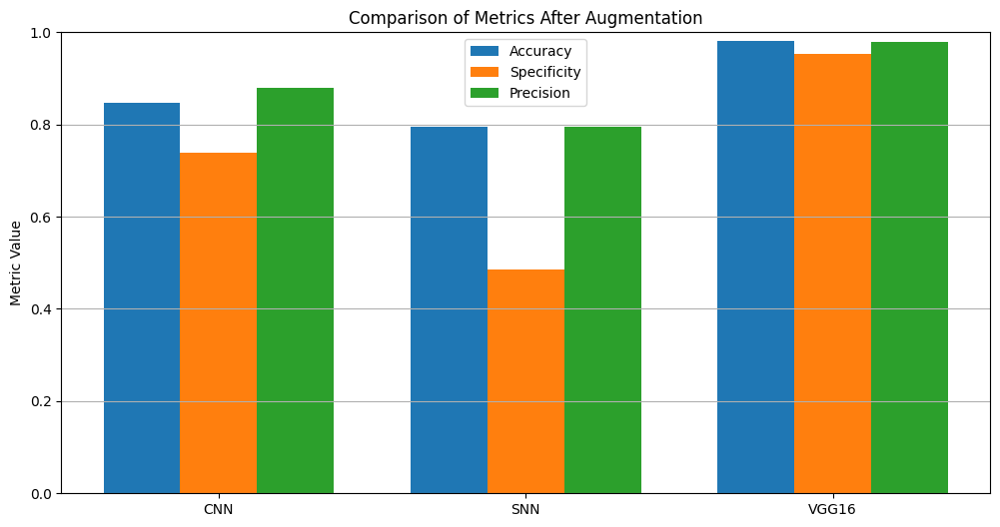

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Metrics for each model after augmentation
metrics_after_augmentation = {
    "CNN": [accuracy_cnn_aug, specificity_cnn_aug, precision_cnn_aug],
    "SNN": [accuracy_snn_aug, specificity_snn_aug, precision_snn_aug],
    "VGG16": [accuracy_vgg_aug, specificity_vgg_aug, precision_vgg_aug]
}

# Prepare data for the bar chart
models = list(metrics_after_augmentation.keys())  # Model names
metrics = ["Accuracy", "Specificity", "Precision"]  # Metric names
values = np.array(list(metrics_after_augmentation.values())).T  # Transpose for metric-wise bars

# Plot the bar chart
x = np.arange(len(models))  # Model indices
width = 0.25  # Width of each bar group

plt.figure(figsize=(12, 6))
for i, metric in enumerate(metrics):
    plt.bar(x + i * width, values[i], width, label=metric)

# Customize the chart
plt.xticks(x + width, models)  # Center x-ticks under grouped bars
plt.ylim(0, 1)  # Metric values between 0 and 1
plt.ylabel("Metric Value")
plt.title("Comparison of Metrics After Augmentation")
plt.legend(metrics)
plt.grid(axis="y")

# Show the chart
plt.show()


In [ ]:
# Generate predictions for CNN before augmentation
preds_cnn, y_true_cnn = c3.get_preds()
# Generate predictions for SNN before augmentation
preds_snn, y_true_snn = c2.get_preds()
# Generate predictions for VGG16 before augmentation
preds_vgg, y_true_vgg = c4.get_preds()


In [ ]:
# CNN metrics before augmentation
y_pred_binary_cnn_before = (preds_cnn[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_cnn, y_pred_binary_cnn_before).ravel()

accuracy_cnn_before = (tp + tn) / (tp + tn + fp + fn)
specificity_cnn_before = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_cnn_before = tp / (tp + fp) if (tp + fp) > 0 else 0
# SNN metrics before augmentation
y_pred_binary_snn_before = (preds_snn[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_snn, y_pred_binary_snn_before).ravel()

accuracy_snn_before = (tp + tn) / (tp + tn + fp + fn)
specificity_snn_before = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_snn_before = tp / (tp + fp) if (tp + fp) > 0 else 0
# VGG16 metrics before augmentation
y_pred_binary_vgg_before = (preds_vgg[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_vgg, y_pred_binary_vgg_before).ravel()

accuracy_vgg_before = (tp + tn) / (tp + tn + fp + fn)
specificity_vgg_before = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_vgg_before = tp / (tp + fp) if (tp + fp) > 0 else 0


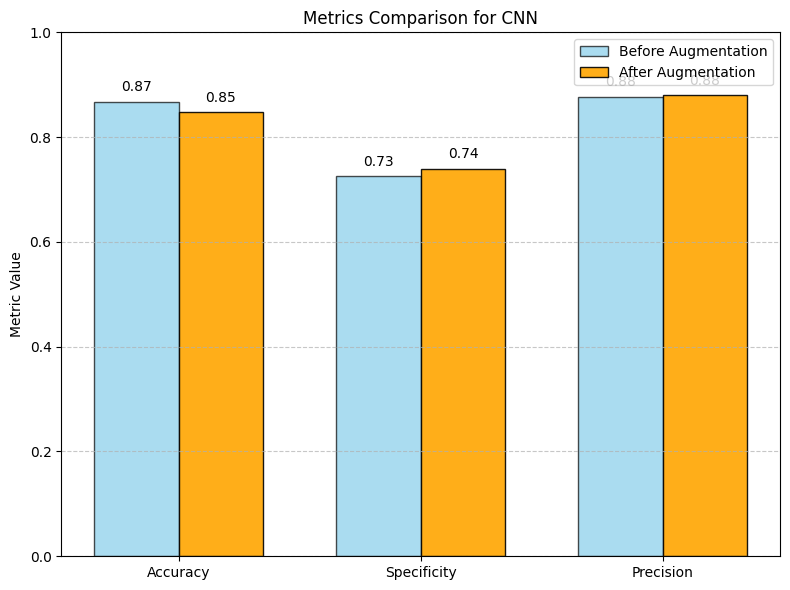

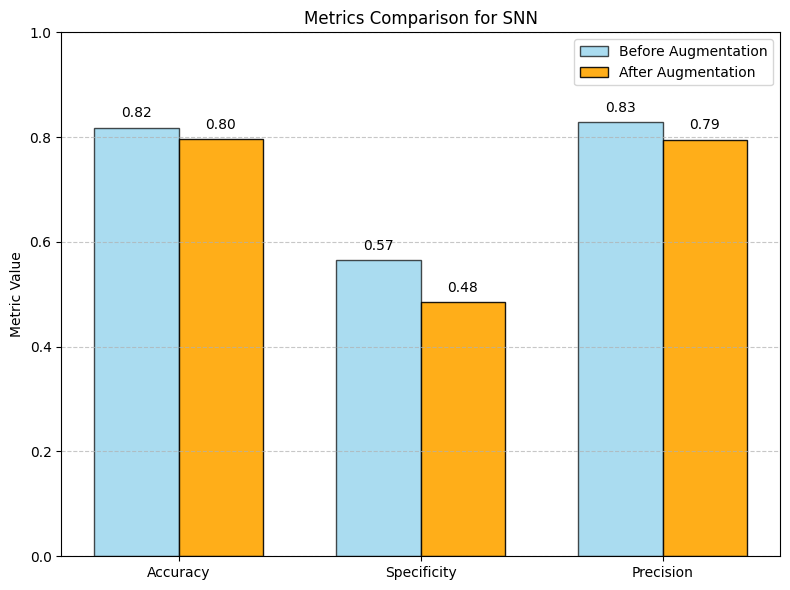

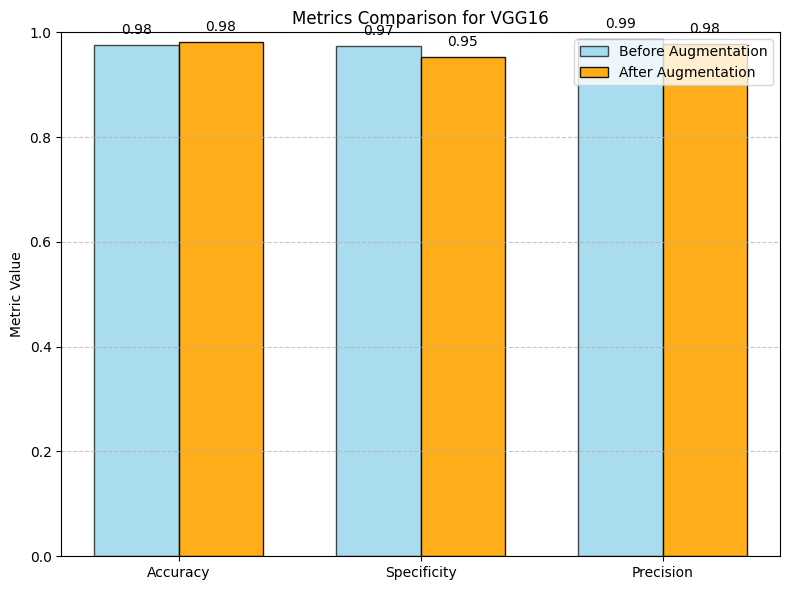

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Metrics for each model before and after augmentation
metrics = ["Accuracy", "Specificity", "Precision"]
models_metrics = {
    "CNN": {
        "Before": [accuracy_cnn_before, specificity_cnn_before, precision_cnn_before],
        "After": [accuracy_cnn_aug, specificity_cnn_aug, precision_cnn_aug]
    },
    "SNN": {
        "Before": [accuracy_snn_before, specificity_snn_before, precision_snn_before],
        "After": [accuracy_snn_aug, specificity_snn_aug, precision_snn_aug]
    },
    "VGG16": {
        "Before": [accuracy_vgg_before, specificity_vgg_before, precision_vgg_before],
        "After": [accuracy_vgg_aug, specificity_vgg_aug, precision_vgg_aug]
    }
}

# Generate a separate bar chart for each model
for model_name, metric_data in models_metrics.items():
    before = metric_data["Before"]
    after = metric_data["After"]

    x = np.arange(len(metrics))  # Metric indices
    width = 0.35  # Width of each bar

    plt.figure(figsize=(8, 6))
    # Bars for "Before" metrics
    plt.bar(x - width/2, before, width, label="Before Augmentation", alpha=0.7, color='skyblue', edgecolor="black")
    # Bars for "After" metrics
    plt.bar(x + width/2, after, width, label="After Augmentation", alpha=0.9, color='orange', edgecolor="black")

    # Add value labels
    for i in range(len(metrics)):
        plt.text(i - width/2, before[i] + 0.02, f"{before[i]:.2f}", ha='center', fontsize=10)
        plt.text(i + width/2, after[i] + 0.02, f"{after[i]:.2f}", ha='center', fontsize=10)

    # Customize the chart
    plt.xticks(x, metrics)  # Metric names as x-ticks
    plt.ylim(0, 1)  # Metric values between 0 and 1
    plt.ylabel("Metric Value")
    plt.title(f"Metrics Comparison for {model_name}")
    plt.legend()
    plt.grid(axis="y", linestyle="--", alpha=0.7)

    # Show the chart
    plt.tight_layout()
    plt.show()


ADDRESSING CLASS IMBALANCE ISSUE

CNN (AUGENTED AND CLASS IMBALNCE IMPLEMENTED)

Class Distribution: Counter({'malignant': 1370, 'benign': 625})
Minority Class: benign (625 samples)
Majority Class: malignant (1370 samples)


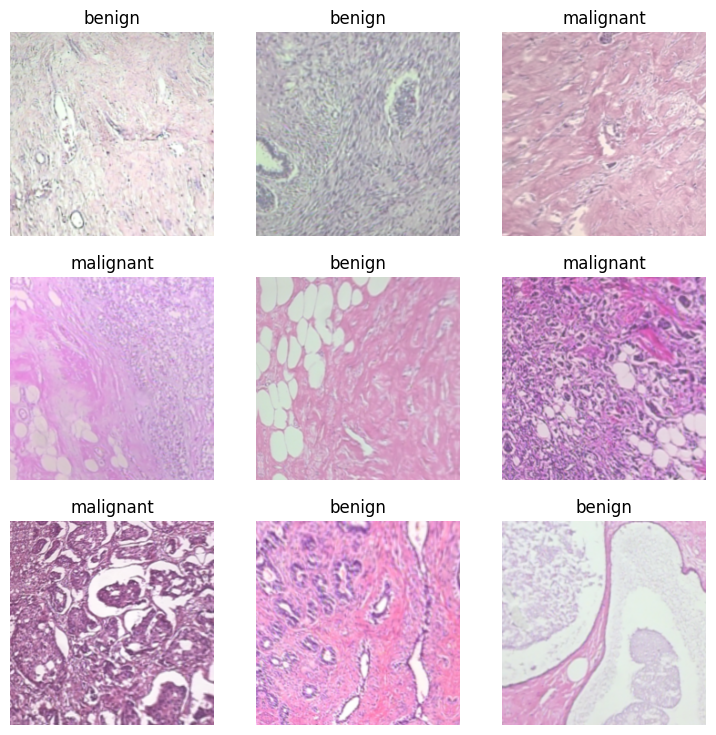

In [ ]:
from collections import Counter
import random

# Check class distribution
class_counts = Counter([parent_label(f) for f in get_image_files(path)])
print("Class Distribution:", class_counts)

# Identify minority and majority classes
minority_class = min(class_counts, key=class_counts.get)
majority_class = max(class_counts, key=class_counts.get)
print(f"Minority Class: {minority_class} ({class_counts[minority_class]} samples)")
print(f"Majority Class: {majority_class} ({class_counts[majority_class]} samples)")

# Oversample the minority class
oversampled_items = []
for item in get_image_files(path):
    label = parent_label(item)
    if label == minority_class:
        # Duplicate minority class items to match majority class size
        oversampled_items.extend([item] * (class_counts[majority_class] // class_counts[minority_class]))
    else:
        oversampled_items.append(item)

# Shuffle the oversampled dataset
random.shuffle(oversampled_items)

# Define a custom function to return oversampled items
def get_oversampled_items(_):
    return oversampled_items

# Create DataBlock with augmentation and oversampled items
data_oversampled_augmented = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_oversampled_items,
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.3),  # 70% train, 30% validation
    item_tfms=Resize(224),  # Resize to match CNN input size
    batch_tfms=aug_transforms(do_flip=True, max_lighting=0.2, flip_vert=True)  # Include augmentations
)

# Create DataLoaders
dls_oversampled_augmented = data_oversampled_augmented.dataloaders(path, bs=32)

# Visualize augmented and oversampled data
dls_oversampled_augmented.show_batch(max_n=9)


In [ ]:
# Define the CNN model
class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        self.conv_block1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        # Fully connected layers with Dropout
        self.fc1 = nn.Linear(256 * 14 * 14, 512)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, 2)

    def forward(self, x):
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.conv_block4(x)
        x = x.view(x.size(0), -1)  # Flatten
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# Initialize the model
model_cnn_aug_oversampled = CustomCNN()

# Define the learner
c3_cnn_aug_oversampled = Learner(
    dls_oversampled_augmented,
    model=model_cnn_aug_oversampled,
    loss_func=CrossEntropyLossFlat(),
    metrics=[accuracy, Precision(average='micro'), Recall(average='micro')]
)

# Train the model
c3_cnn_aug_oversampled.fit_one_cycle(10, lr_max=1e-5)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.608247,0.525387,0.768448,0.768448,0.768448,00:10
1,0.557855,0.452390,0.783715,0.783715,0.783715,00:10
2,0.512060,0.426578,0.793893,0.793893,0.793893,00:10
3,0.482119,0.414731,0.811705,0.811705,0.811705,00:10
4,0.469304,0.433717,0.805344,0.805344,0.805344,00:10
5,0.453076,0.397535,0.814249,0.814249,0.814249,00:10
6,0.437947,0.388256,0.821883,0.821883,0.821883,00:10
7,0.430339,0.373196,0.835878,0.835878,0.835878,00:09
8,0.412136,0.390070,0.832061,0.832061,0.832061,00:10
9,0.417620,0.383494,0.840967,0.840967,0.840967,00:10


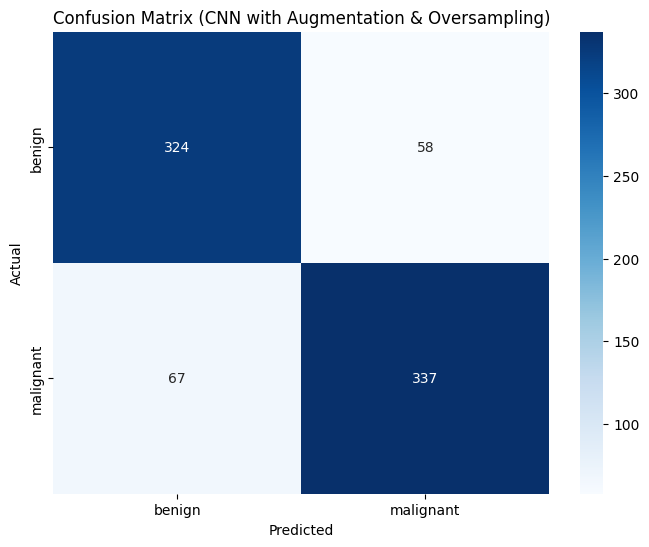

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Generate predictions
preds_cnn_aug_oversampled, y_true_cnn_aug_oversampled = c3_cnn_aug_oversampled.get_preds()

# Confusion matrix
y_pred_cnn_aug_oversampled = preds_cnn_aug_oversampled.argmax(dim=1).numpy()
y_true_cnn_aug_oversampled = y_true_cnn_aug_oversampled.numpy()
cm = confusion_matrix(y_true_cnn_aug_oversampled, y_pred_cnn_aug_oversampled)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=dls_oversampled_augmented.vocab, yticklabels=dls_oversampled_augmented.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (CNN with Augmentation & Oversampling)')
plt.show()


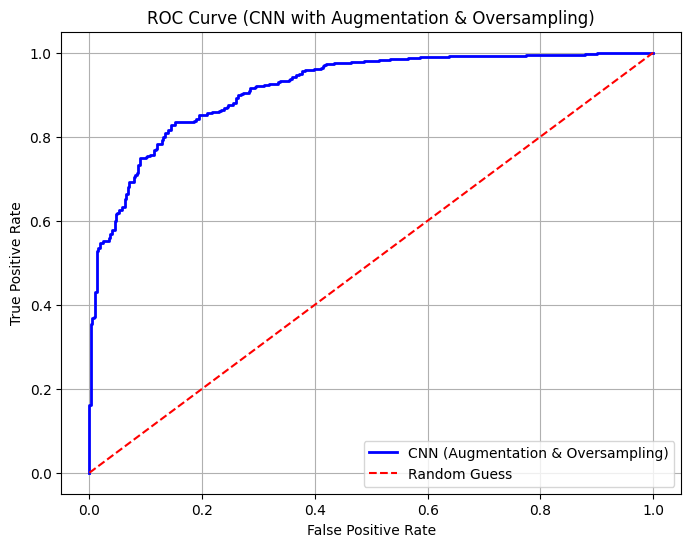

In [ ]:
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr_cnn, tpr_cnn, _ = roc_curve(y_true_cnn_aug_oversampled, preds_cnn_aug_oversampled[:, 1].numpy())

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_cnn, tpr_cnn, label="CNN (Augmentation & Oversampling)", color='blue', linewidth=2)
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (CNN with Augmentation & Oversampling)")
plt.legend()
plt.grid()
plt.show()


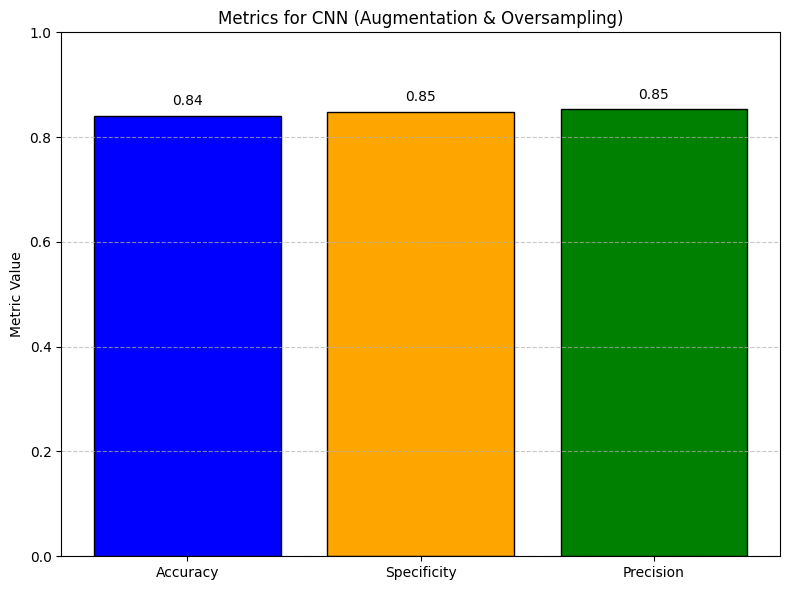

In [ ]:
# Calculate metrics
chosen_threshold = 0.5
y_pred_binary_cnn_aug_oversampled = (preds_cnn_aug_oversampled[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_cnn_aug_oversampled, y_pred_binary_cnn_aug_oversampled).ravel()

# Compute metrics
accuracy_cnn_aug_oversampled = (tp + tn) / (tp + tn + fp + fn)
specificity_cnn_aug_oversampled = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_cnn_aug_oversampled = tp / (tp + fp) if (tp + fp) > 0 else 0

# Prepare data for bar chart
metrics = ['Accuracy', 'Specificity', 'Precision']
values = [accuracy_cnn_aug_oversampled, specificity_cnn_aug_oversampled, precision_cnn_aug_oversampled]

# Plot bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics, values, color=['blue', 'orange', 'green'], edgecolor="black")
plt.ylim(0, 1)
plt.ylabel("Metric Value")
plt.title("Metrics for CNN (Augmentation & Oversampling)")

# Add numeric values on top of bars
for i, v in enumerate(values):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center', fontsize=10)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


True Label: benign (Index: TensorCategory(0))
Predicted Label: benign (Index: 0)
Probabilities:
  benign: 0.9773
  malignant: 0.0227


<Axes: title={'center': 'True: benign | Predicted: benign'}>

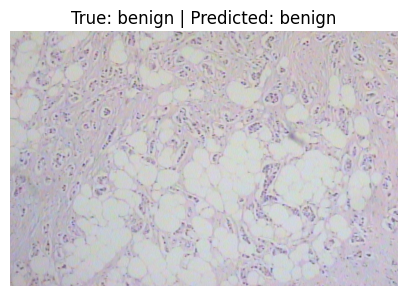

In [ ]:
# Get a sample image and its true label from the validation dataset
img, true_label = dls_oversampled_augmented.valid_ds[0]  # Use the first validation sample

# Make a prediction using the trained CNN model
prediction_cnn = c3_cnn_aug_oversampled.predict(img)

# Extract prediction details
predicted_label_cnn = prediction_cnn[0]  # Predicted class label
predicted_index_cnn = prediction_cnn[1]  # Index of the predicted class
probabilities_cnn = prediction_cnn[2]    # Probabilities for each class

# Map the true label index to its string representation
true_label_str = dls_oversampled_augmented.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label_cnn} (Index: {predicted_index_cnn.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities_cnn):
    label = dls_oversampled_augmented.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with the prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label_cnn}")


SNN AUGMENTED AND IMBALANCE IMPLEMENTED

In [ ]:
# Define the SimpleNet (Shallow Neural Network) model
class SimpleNet(nn.Module):
    def __init__(self):
        super(SimpleNet, self).__init__()
        self.fc1 = nn.Linear(224 * 224 * 3, 128)  # Adjust input size for flattened 224x224 images
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 2)

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten the input
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Initialize the model
model_snn_aug_oversampled = SimpleNet()

# Define the learner
c2_snn_aug_oversampled = Learner(
    dls_oversampled_augmented,  # Use oversampled and augmented DataLoaders
    model=model_snn_aug_oversampled,
    loss_func=CrossEntropyLossFlat(),
    metrics=[accuracy, Precision(average='micro'), Recall(average='micro')]
)

# Train the SNN
c2_snn_aug_oversampled.fit_one_cycle(10, lr_max=1e-4)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.694388,0.683921,0.513995,0.513995,0.513995,00:10
1,0.664910,0.607917,0.731552,0.731552,0.731552,00:10
2,0.631984,0.614919,0.678117,0.678117,0.678117,00:10
3,0.617210,0.591196,0.667939,0.667939,0.667939,00:10
4,0.600349,0.644657,0.624682,0.624682,0.624682,00:10
5,0.582622,0.551935,0.731552,0.731552,0.731552,00:10
6,0.571503,0.553038,0.768448,0.768448,0.768448,00:10
7,0.553179,0.548091,0.753181,0.753181,0.753181,00:09
8,0.556174,0.548770,0.712468,0.712468,0.712468,00:10
9,0.558183,0.545269,0.737913,0.737913,0.737913,00:09


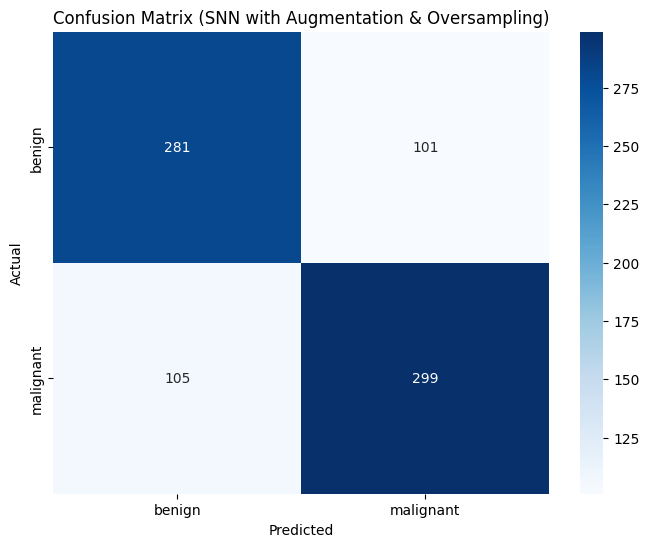

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Generate predictions
preds_snn_aug_oversampled, y_true_snn_aug_oversampled = c2_snn_aug_oversampled.get_preds()

# Confusion matrix
y_pred_snn_aug_oversampled = preds_snn_aug_oversampled.argmax(dim=1).numpy()
y_true_snn_aug_oversampled = y_true_snn_aug_oversampled.numpy()
cm_snn = confusion_matrix(y_true_snn_aug_oversampled, y_pred_snn_aug_oversampled)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_snn, annot=True, fmt='d', cmap='Blues', xticklabels=dls_oversampled_augmented.vocab, yticklabels=dls_oversampled_augmented.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (SNN with Augmentation & Oversampling)')
plt.show()


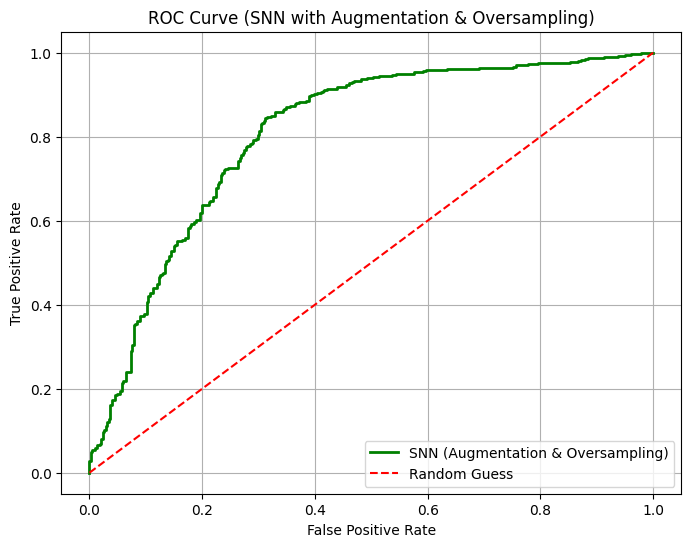

In [ ]:
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr_snn, tpr_snn, _ = roc_curve(y_true_snn_aug_oversampled, preds_snn_aug_oversampled[:, 1].numpy())

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_snn, tpr_snn, label="SNN (Augmentation & Oversampling)", color='green', linewidth=2)
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (SNN with Augmentation & Oversampling)")
plt.legend()
plt.grid()
plt.show()


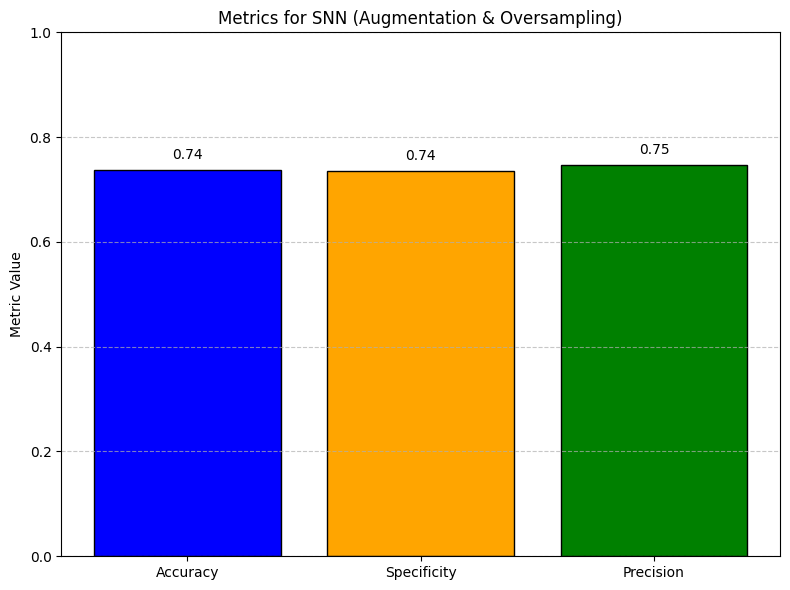

In [ ]:
# Calculate metrics
chosen_threshold = 0.5
y_pred_binary_snn_aug_oversampled = (preds_snn_aug_oversampled[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_snn_aug_oversampled, y_pred_binary_snn_aug_oversampled).ravel()

# Compute metrics
accuracy_snn_aug_oversampled = (tp + tn) / (tp + tn + fp + fn)
specificity_snn_aug_oversampled = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_snn_aug_oversampled = tp / (tp + fp) if (tp + fp) > 0 else 0

# Prepare data for bar chart
metrics_snn = ['Accuracy', 'Specificity', 'Precision']
values_snn = [accuracy_snn_aug_oversampled, specificity_snn_aug_oversampled, precision_snn_aug_oversampled]

# Plot bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics_snn, values_snn, color=['blue', 'orange', 'green'], edgecolor="black")
plt.ylim(0, 1)
plt.ylabel("Metric Value")
plt.title("Metrics for SNN (Augmentation & Oversampling)")

# Add numeric values on top of bars
for i, v in enumerate(values_snn):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center', fontsize=10)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


True Label: benign (Index: TensorCategory(0))
Predicted Label: benign (Index: 0)
Probabilities:
  benign: 0.7796
  malignant: 0.2204


<Axes: title={'center': 'True: benign | Predicted: benign'}>

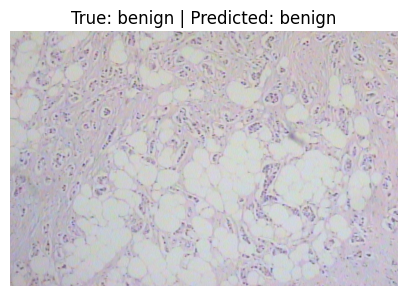

In [ ]:
# Get a sample image and its true label from the validation dataset
img, true_label = dls_oversampled_augmented.valid_ds[0]

# Make a prediction
prediction_snn = c2_snn_aug_oversampled.predict(img)

# Extract prediction details
predicted_label_snn = prediction_snn[0]  # Predicted class label
predicted_index_snn = prediction_snn[1]  # Index of the predicted class
probabilities_snn = prediction_snn[2]    # Probabilities for each class

# Map the true label index to its string representation
true_label_str = dls_oversampled_augmented.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label_snn} (Index: {predicted_index_snn.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities_snn):
    label = dls_oversampled_augmented.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with the prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label_snn}")


VGG16 AUGMENTED AND IMBALANCE IMPLEMENTED

In [ ]:
from torchvision.models import vgg16
import torch.nn as nn

# Load the pretrained VGG16 model
class VGG16FineTuned(nn.Module):
    def __init__(self):
        super(VGG16FineTuned, self).__init__()
        self.vgg16 = vgg16(pretrained=True)

        # Modify the classifier for binary classification
        self.vgg16.classifier[6] = nn.Linear(4096, 2)

    def forward(self, x):
        return self.vgg16(x)

# Initialize the VGG16 model
model_vgg_aug_oversampled = VGG16FineTuned()

# Define the learner
c4_vgg_aug_oversampled = Learner(
    dls_oversampled_augmented,  # Use oversampled and augmented DataLoaders
    model=model_vgg_aug_oversampled,
    loss_func=CrossEntropyLossFlat(),
    metrics=[accuracy, Precision(average='micro'), Recall(average='micro')]
)

# Train the VGG16 model
c4_vgg_aug_oversampled.fit_one_cycle(10, lr_max=1e-4)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.572011,0.359407,0.860051,0.860051,0.860051,00:11
1,0.420579,0.332882,0.867684,0.867684,0.867684,00:11
2,0.270874,0.226487,0.894402,0.894402,0.894402,00:11
3,0.199356,0.167090,0.954198,0.954198,0.954198,00:11
4,0.163049,0.121232,0.958015,0.958015,0.958015,00:10
5,0.105339,0.073589,0.973282,0.973282,0.973282,00:10
6,0.070934,0.037233,0.987277,0.987277,0.987277,00:10
7,0.051203,0.034475,0.983461,0.983461,0.983461,00:10
8,0.032950,0.034465,0.987277,0.987277,0.987277,00:10
9,0.023446,0.027464,0.991094,0.991094,0.991094,00:10


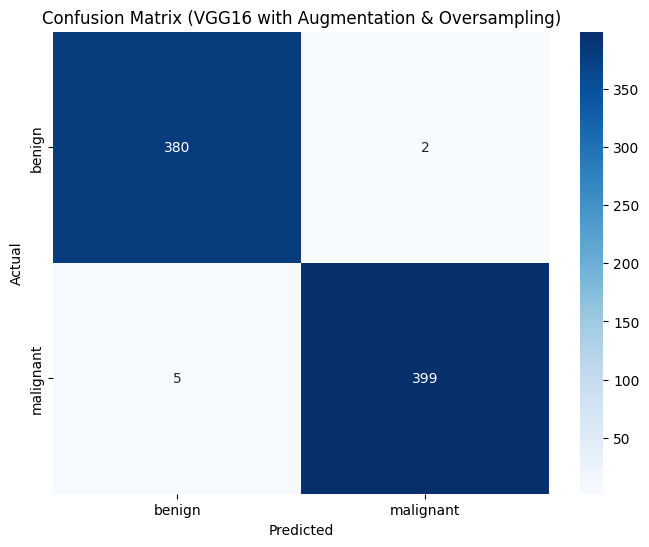

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Generate predictions
preds_vgg_aug_oversampled, y_true_vgg_aug_oversampled = c4_vgg_aug_oversampled.get_preds()

# Confusion matrix
y_pred_vgg_aug_oversampled = preds_vgg_aug_oversampled.argmax(dim=1).numpy()
y_true_vgg_aug_oversampled = y_true_vgg_aug_oversampled.numpy()
cm_vgg = confusion_matrix(y_true_vgg_aug_oversampled, y_pred_vgg_aug_oversampled)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_vgg, annot=True, fmt='d', cmap='Blues', xticklabels=dls_oversampled_augmented.vocab, yticklabels=dls_oversampled_augmented.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (VGG16 with Augmentation & Oversampling)')
plt.show()


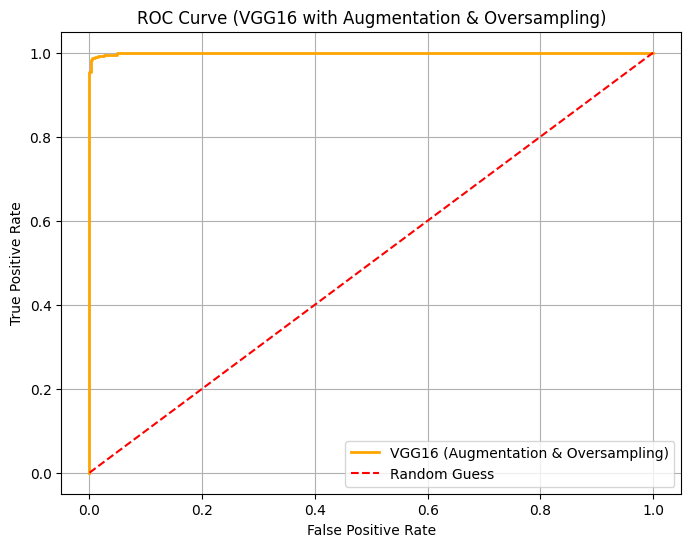

In [ ]:
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr_vgg, tpr_vgg, _ = roc_curve(y_true_vgg_aug_oversampled, preds_vgg_aug_oversampled[:, 1].numpy())

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_vgg, tpr_vgg, label="VGG16 (Augmentation & Oversampling)", color='orange', linewidth=2)
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (VGG16 with Augmentation & Oversampling)")
plt.legend()
plt.grid()
plt.show()


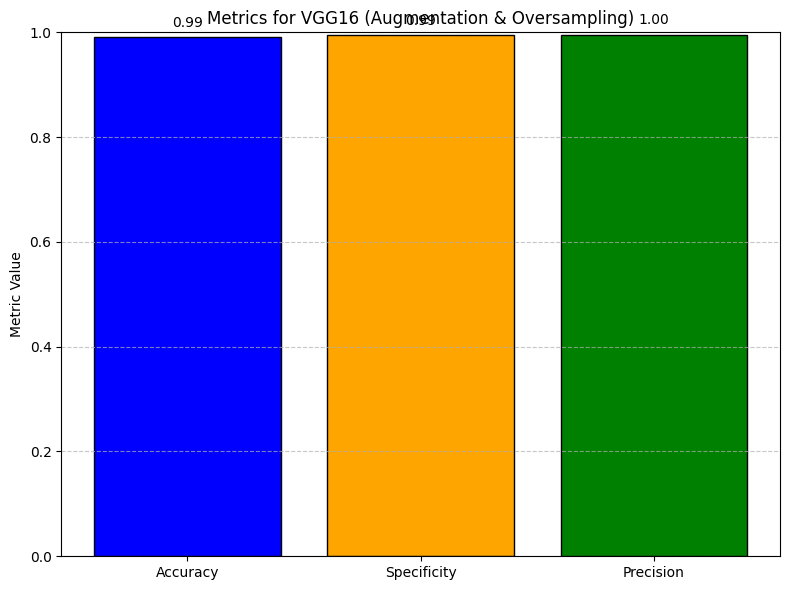

In [ ]:
# Calculate metrics
chosen_threshold = 0.5
y_pred_binary_vgg_aug_oversampled = (preds_vgg_aug_oversampled[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_vgg_aug_oversampled, y_pred_binary_vgg_aug_oversampled).ravel()

# Compute metrics
accuracy_vgg_aug_oversampled = (tp + tn) / (tp + tn + fp + fn)
specificity_vgg_aug_oversampled = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_vgg_aug_oversampled = tp / (tp + fp) if (tp + fp) > 0 else 0

# Prepare data for bar chart
metrics_vgg = ['Accuracy', 'Specificity', 'Precision']
values_vgg = [accuracy_vgg_aug_oversampled, specificity_vgg_aug_oversampled, precision_vgg_aug_oversampled]

# Plot bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics_vgg, values_vgg, color=['blue', 'orange', 'green'], edgecolor="black")
plt.ylim(0, 1)
plt.ylabel("Metric Value")
plt.title("Metrics for VGG16 (Augmentation & Oversampling)")

# Add numeric values on top of bars
for i, v in enumerate(values_vgg):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center', fontsize=10)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


True Label: benign (Index: TensorCategory(0))
Predicted Label: benign (Index: 0)
Probabilities:
  benign: 0.8879
  malignant: 0.1121


<Axes: title={'center': 'True: benign | Predicted: benign'}>

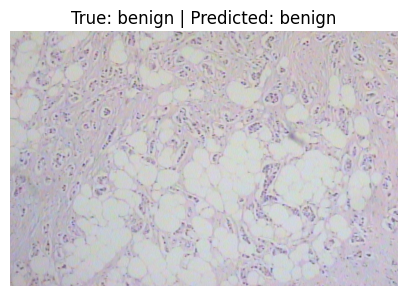

In [ ]:
# Get a sample image and its true label from the validation dataset
img, true_label = dls_oversampled_augmented.valid_ds[0]

# Make a prediction
prediction_vgg = c4_vgg_aug_oversampled.predict(img)

# Extract prediction details
predicted_label_vgg = prediction_vgg[0]  # Predicted class label
predicted_index_vgg = prediction_vgg[1]  # Index of the predicted class
probabilities_vgg = prediction_vgg[2]    # Probabilities for each class

# Map the true label index to its string representation
true_label_str = dls_oversampled_augmented.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label_vgg} (Index: {predicted_index_vgg.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities_vgg):
    label = dls_oversampled_augmented.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with the prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label_vgg}")


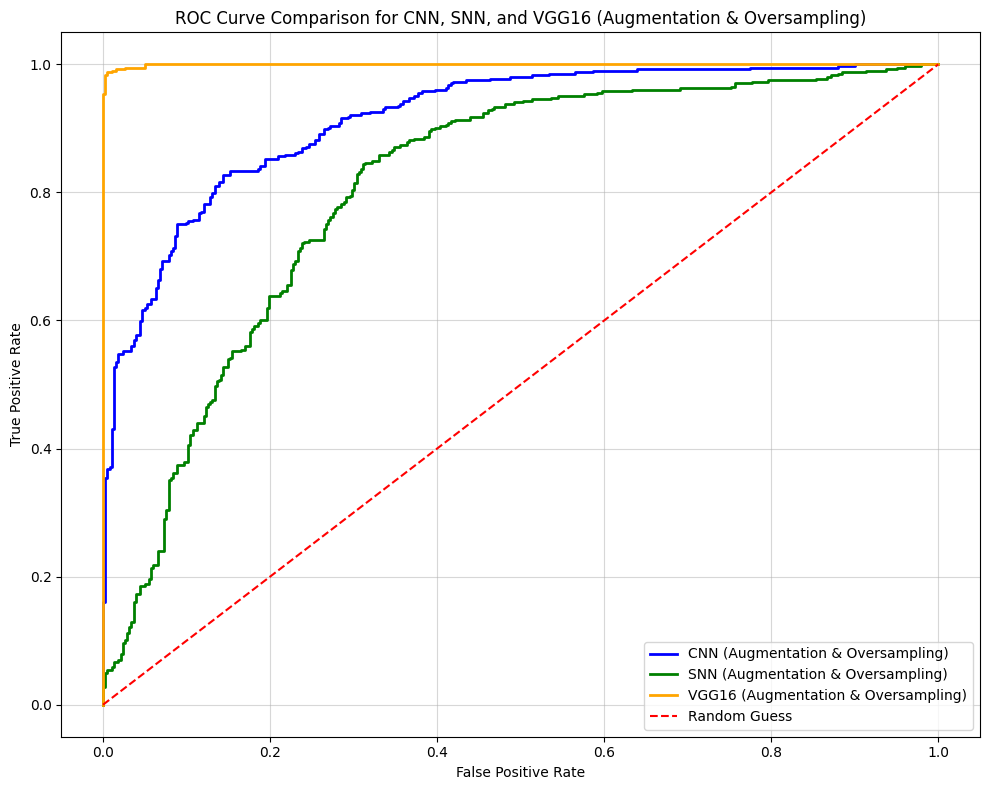

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

# Compute ROC curves for each model
fpr_cnn, tpr_cnn, _ = roc_curve(y_true_cnn_aug_oversampled, preds_cnn_aug_oversampled[:, 1].numpy())
fpr_snn, tpr_snn, _ = roc_curve(y_true_snn_aug_oversampled, preds_snn_aug_oversampled[:, 1].numpy())
fpr_vgg, tpr_vgg, _ = roc_curve(y_true_vgg_aug_oversampled, preds_vgg_aug_oversampled[:, 1].numpy())

# Plot ROC curves
plt.figure(figsize=(10, 8))

# CNN ROC Curve
plt.plot(fpr_cnn, tpr_cnn, label="CNN (Augmentation & Oversampling)", color="blue", linewidth=2)
# SNN ROC Curve
plt.plot(fpr_snn, tpr_snn, label="SNN (Augmentation & Oversampling)", color="green", linewidth=2)
# VGG16 ROC Curve
plt.plot(fpr_vgg, tpr_vgg, label="VGG16 (Augmentation & Oversampling)", color="orange", linewidth=2)

# Random guess diagonal line
plt.plot([0, 1], [0, 1], color="red", linestyle="--", label="Random Guess")

# Customize the plot
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison for CNN, SNN, and VGG16 (Augmentation & Oversampling)")
plt.legend(loc="lower right")
plt.grid(alpha=0.5)

# Show the plot
plt.tight_layout()
plt.show()


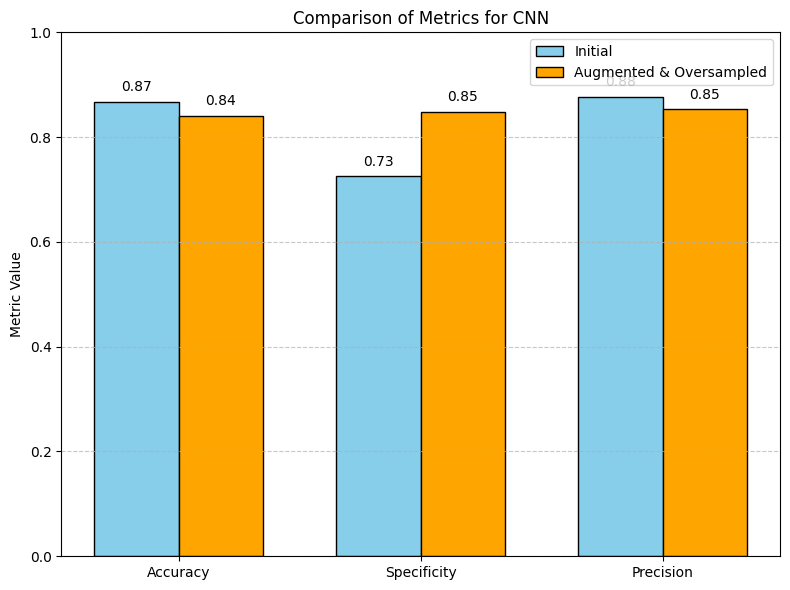

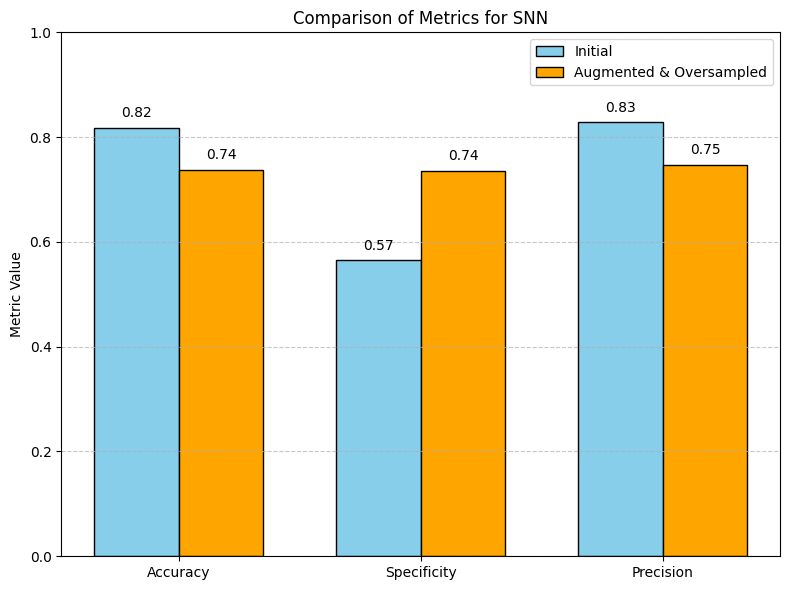

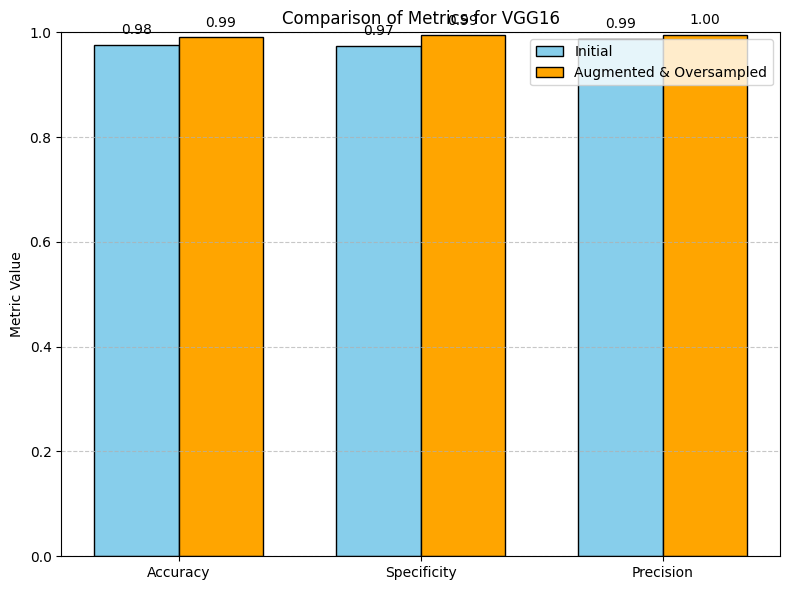

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to plot comparison bar chart for a model
def plot_comparison_chart(model_name, metrics_initial, metrics_augmented):
    metrics = ['Accuracy', 'Specificity', 'Precision']
    x = np.arange(len(metrics))  # Metric indices
    width = 0.35  # Width of each bar

    # Plot the bar chart
    plt.figure(figsize=(8, 6))
    plt.bar(x - width/2, metrics_initial, width, label="Initial", color='skyblue', edgecolor="black")
    plt.bar(x + width/2, metrics_augmented, width, label="Augmented & Oversampled", color='orange', edgecolor="black")

    # Add numeric values on top of bars
    for i, v in enumerate(metrics_initial):
        plt.text(i - width/2, v + 0.02, f"{v:.2f}", ha='center', fontsize=10)
    for i, v in enumerate(metrics_augmented):
        plt.text(i + width/2, v + 0.02, f"{v:.2f}", ha='center', fontsize=10)

    # Customize the chart
    plt.xticks(x, metrics)
    plt.ylim(0, 1)
    plt.ylabel("Metric Value")
    plt.title(f"Comparison of Metrics for {model_name}")
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# CNN Comparison
plot_comparison_chart(
    "CNN",
    [accuracy_cnn_before, specificity_cnn_before, precision_cnn_before],
    [accuracy_cnn_aug_oversampled, specificity_cnn_aug_oversampled, precision_cnn_aug_oversampled]
)

# SNN Comparison
plot_comparison_chart(
    "SNN",
    [accuracy_snn_before, specificity_snn_before, precision_snn_before],
    [accuracy_snn_aug_oversampled, specificity_snn_aug_oversampled, precision_snn_aug_oversampled]
)

# VGG16 Comparison
plot_comparison_chart(
    "VGG16",
    [accuracy_vgg_before, specificity_vgg_before, precision_vgg_before],
    [accuracy_vgg_aug_oversampled, specificity_vgg_aug_oversampled, precision_vgg_aug_oversampled]
)


100X Images with augmentation and class imbalance

In [ ]:
from collections import Counter
from fastai.vision.all import *
import random

# Update path for 100x magnification dataset
path_100x = Path("/content/drive/MyDrive/Colab Notebooks/breast_cancer_dataset100X")

# Check class distribution
class_counts_100x = Counter([parent_label(f) for f in get_image_files(path_100x)])
print("Class Distribution (100X):", class_counts_100x)

# Identify minority and majority classes
minority_class = min(class_counts_100x, key=class_counts_100x.get)
majority_class = max(class_counts_100x, key=class_counts_100x.get)
print(f"Minority Class: {minority_class} ({class_counts_100x[minority_class]} samples)")
print(f"Majority Class: {majority_class} ({class_counts_100x[majority_class]} samples)")


Class Distribution (100X): Counter({'malignant': 1437, 'benign': 644})
Minority Class: benign (644 samples)
Majority Class: malignant (1437 samples)


In [ ]:
# Oversample the minority class
oversampled_items_100x = []
for item in get_image_files(path_100x):
    label = parent_label(item)
    if label == minority_class:
        # Duplicate minority class items to match majority class size
        oversampled_items_100x.extend([item] * (class_counts_100x[majority_class] // class_counts_100x[minority_class]))
    else:
        oversampled_items_100x.append(item)

# Shuffle the oversampled dataset
random.shuffle(oversampled_items_100x)

# Custom function to return oversampled items
def get_oversampled_items_100x(_):
    return oversampled_items_100x


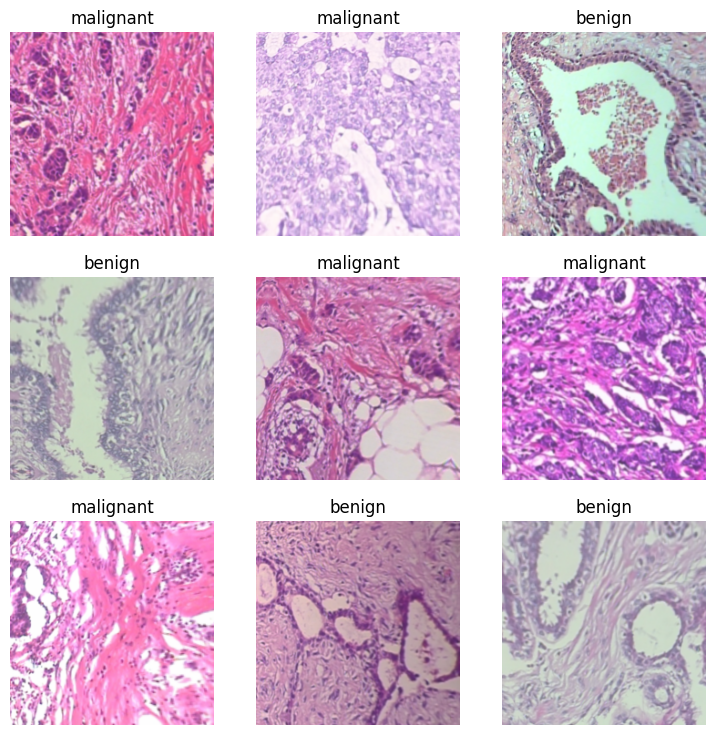

In [ ]:
# Create the DataBlock for oversampling and augmentation
data_oversampled_augmented_100x = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_oversampled_items_100x,  # Oversampled items
    get_y=parent_label,
    splitter=RandomSplitter(valid_pct=0.3),  # 70% train, 30% validation
    item_tfms=Resize(224),  # Resize to match input size of models
    batch_tfms=aug_transforms(do_flip=True, max_lighting=0.2, flip_vert=True)  # Include augmentations
)

# Create DataLoaders
dls_oversampled_augmented_100x = data_oversampled_augmented_100x.dataloaders(path_100x, bs=32)

# Visualize augmented and oversampled data
dls_oversampled_augmented_100x.show_batch(max_n=9)


100X CNN AUGMENTED AND CLASSIMBALANCE

In [ ]:
# Define the CNN model
class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        self.conv_block1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )
        self.conv_block4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        # Fully connected layers with Dropout
        self.fc1 = nn.Linear(256 * 14 * 14, 512)
        self.dropout = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, 2)

    def forward(self, x):
        x = self.conv_block1(x)
        x = self.conv_block2(x)
        x = self.conv_block3(x)
        x = self.conv_block4(x)
        x = x.view(x.size(0), -1)  # Flatten
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

# Initialize the CNN model
model_cnn_100x = CustomCNN()

# Define the learner
c3_cnn_100x = Learner(
    dls_oversampled_augmented_100x,
    model=model_cnn_100x,
    loss_func=CrossEntropyLossFlat(),
    metrics=[accuracy, Precision(average='micro'), Recall(average='micro')]
)

# Train the model
c3_cnn_100x.fit_one_cycle(10, lr_max=1e-5)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.584517,0.515885,0.745410,0.745410,0.745410,02:11
1,0.525463,0.482699,0.746634,0.746634,0.746634,00:10
2,0.501720,0.524932,0.736842,0.736842,0.736842,00:11
3,0.491878,0.461303,0.773562,0.773562,0.773562,00:11
4,0.479361,0.413365,0.799266,0.799266,0.799266,00:11
5,0.452677,0.411745,0.779682,0.779682,0.779682,00:11
6,0.447795,0.389456,0.805386,0.805386,0.805386,00:10
7,0.424728,0.385885,0.811505,0.811506,0.811506,00:10
8,0.420508,0.379809,0.804162,0.804162,0.804162,00:10
9,0.401339,0.383591,0.799266,0.799266,0.799266,00:10


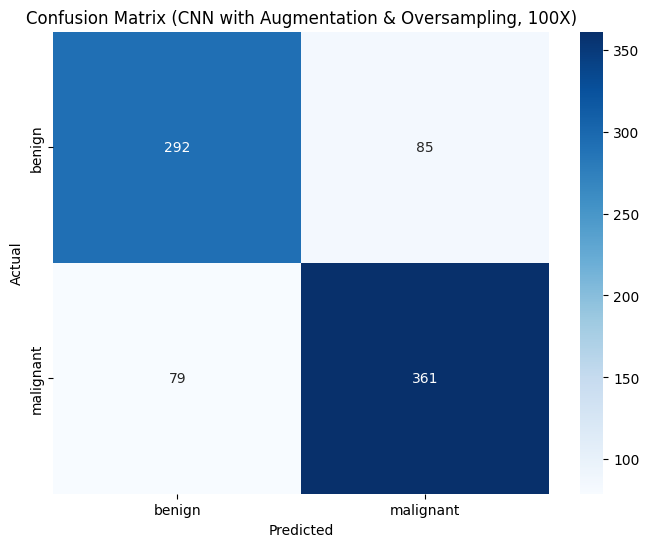

In [ ]:
# Generate predictions
preds_cnn_100x, y_true_cnn_100x = c3_cnn_100x.get_preds()

# Compute confusion matrix
y_pred_cnn_100x = preds_cnn_100x.argmax(dim=1).numpy()
y_true_cnn_100x = y_true_cnn_100x.numpy()
cm_cnn_100x = confusion_matrix(y_true_cnn_100x, y_pred_cnn_100x)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_cnn_100x, annot=True, fmt='d', cmap='Blues', xticklabels=dls_oversampled_augmented_100x.vocab, yticklabels=dls_oversampled_augmented_100x.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (CNN with Augmentation & Oversampling, 100X)')
plt.show()


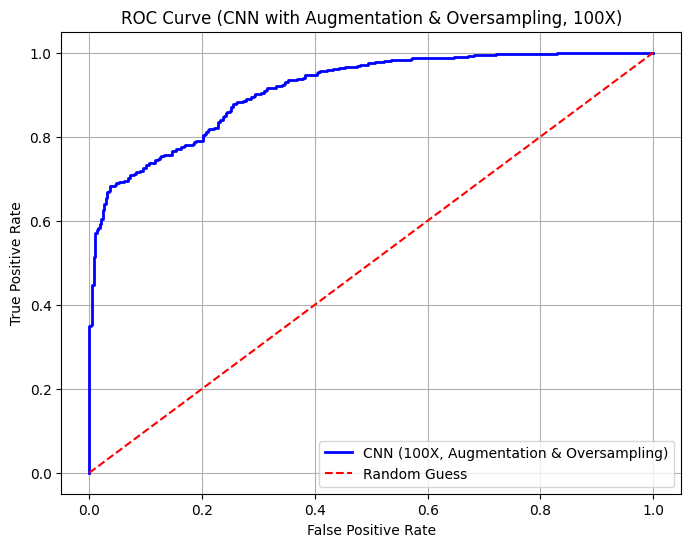

In [ ]:
# Compute ROC curve
fpr_cnn_100x, tpr_cnn_100x, _ = roc_curve(y_true_cnn_100x, preds_cnn_100x[:, 1].numpy())

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_cnn_100x, tpr_cnn_100x, label="CNN (100X, Augmentation & Oversampling)", color='blue', linewidth=2)
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (CNN with Augmentation & Oversampling, 100X)")
plt.legend()
plt.grid()
plt.show()


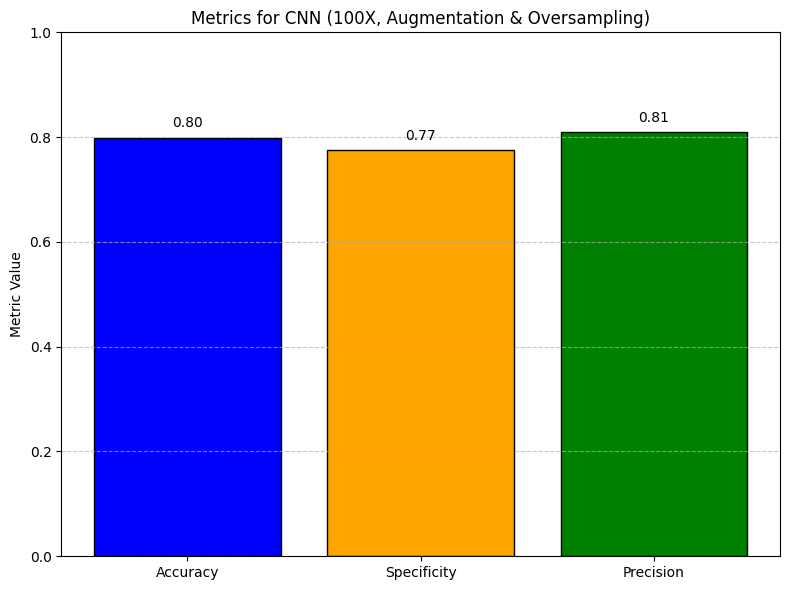

In [ ]:
# Calculate metrics for the CNN model
chosen_threshold = 0.5
y_pred_binary_cnn_100x = (preds_cnn_100x[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_cnn_100x, y_pred_binary_cnn_100x).ravel()

# Compute metrics
accuracy_cnn_100x = (tp + tn) / (tp + tn + fp + fn)
specificity_cnn_100x = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_cnn_100x = tp / (tp + fp) if (tp + fp) > 0 else 0

# Prepare data for the bar chart
metrics = ['Accuracy', 'Specificity', 'Precision']
values = [accuracy_cnn_100x, specificity_cnn_100x, precision_cnn_100x]

# Plot the bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics, values, color=['blue', 'orange', 'green'], edgecolor="black")
plt.ylim(0, 1)
plt.ylabel("Metric Value")
plt.title("Metrics for CNN (100X, Augmentation & Oversampling)")

# Add numeric values on top of bars
for i, v in enumerate(values):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center', fontsize=10)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


True Label: benign (Index: TensorCategory(0))
Predicted Label: benign (Index: 0)
Probabilities:
  benign: 0.9782
  malignant: 0.0218


<Axes: title={'center': 'True: benign | Predicted: benign'}>

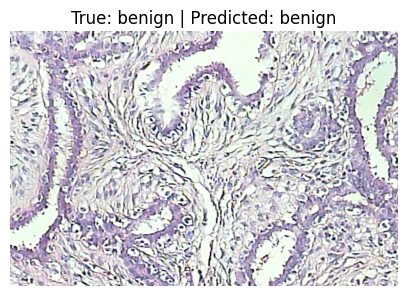

In [ ]:
# Get a sample image and its true label from the validation dataset
img, true_label = dls_oversampled_augmented_100x.valid_ds[1]  # First validation sample

# Make a prediction using the trained CNN model
prediction_cnn_100x = c3_cnn_100x.predict(img)

# Extract prediction details
predicted_label_cnn_100x = prediction_cnn_100x[0]  # Predicted class label
predicted_index_cnn_100x = prediction_cnn_100x[1]  # Index of the predicted class
probabilities_cnn_100x = prediction_cnn_100x[2]    # Probabilities for each class

# Map the true label index to its string representation
true_label_str = dls_oversampled_augmented_100x.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label_cnn_100x} (Index: {predicted_index_cnn_100x.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities_cnn_100x):
    label = dls_oversampled_augmented_100x.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with the prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label_cnn_100x}")


100x SNN AUGMENTED AND CLASSIMBALANCE IMPLEMENTED

In [ ]:
# Define the SimpleNet (Shallow Neural Network) model
class SimpleNet(nn.Module):
    def __init__(self):
        super(SimpleNet, self).__init__()
        self.fc1 = nn.Linear(224 * 224 * 3, 128)  # Adjust input size for flattened 224x224 images
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, 2)

    def forward(self, x):
        x = x.view(x.size(0), -1)  # Flatten the input
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Initialize the SNN model
model_snn_100x = SimpleNet()

# Define the learner
c2_snn_100x = Learner(
    dls_oversampled_augmented_100x,  # Use oversampled and augmented DataLoaders
    model=model_snn_100x,
    loss_func=CrossEntropyLossFlat(),
    metrics=[accuracy, Precision(average='micro'), Recall(average='micro')]
)

# Train the SNN
c2_snn_100x.fit_one_cycle(10, lr_max=1e-4)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.661838,0.616103,0.613219,0.613219,0.613219,00:10
1,0.657107,0.703317,0.556916,0.556916,0.556916,00:11
2,0.600696,0.566502,0.761322,0.761322,0.761322,00:11
3,0.580376,0.592211,0.675643,0.675643,0.675643,00:10
4,0.553200,0.581706,0.687882,0.687882,0.687882,00:10
5,0.549933,0.536871,0.738066,0.738066,0.738066,00:10
6,0.536825,0.538887,0.760098,0.760098,0.760098,00:10
7,0.529297,0.545600,0.714810,0.714810,0.714810,00:10
8,0.531416,0.539664,0.762546,0.762546,0.762546,00:10
9,0.521188,0.533795,0.735618,0.735618,0.735618,00:10


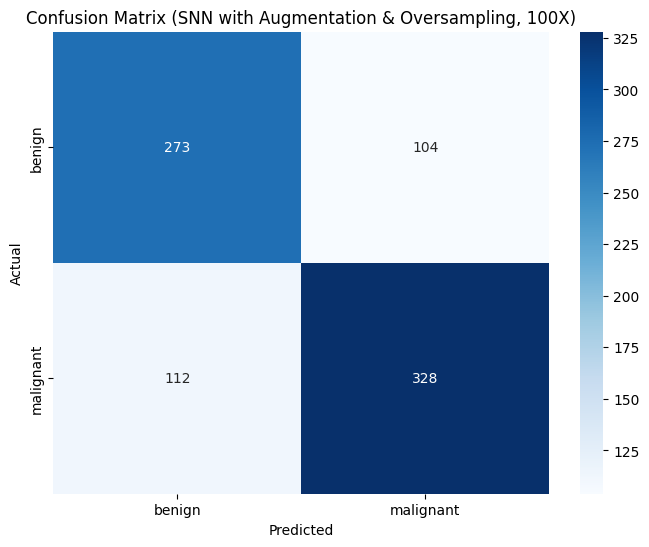

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Generate predictions
preds_snn_100x, y_true_snn_100x = c2_snn_100x.get_preds()

# Confusion matrix
y_pred_snn_100x = preds_snn_100x.argmax(dim=1).numpy()
y_true_snn_100x = y_true_snn_100x.numpy()
cm_snn_100x = confusion_matrix(y_true_snn_100x, y_pred_snn_100x)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_snn_100x, annot=True, fmt='d', cmap='Blues', xticklabels=dls_oversampled_augmented_100x.vocab, yticklabels=dls_oversampled_augmented_100x.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (SNN with Augmentation & Oversampling, 100X)')
plt.show()


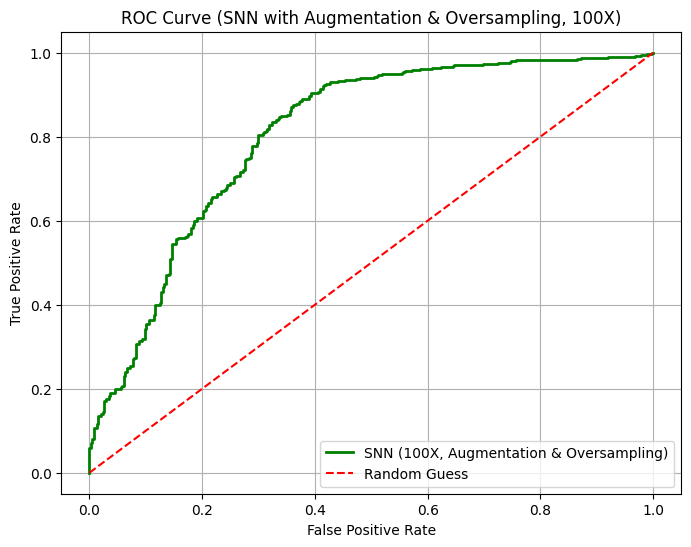

In [ ]:
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr_snn_100x, tpr_snn_100x, _ = roc_curve(y_true_snn_100x, preds_snn_100x[:, 1].numpy())

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_snn_100x, tpr_snn_100x, label="SNN (100X, Augmentation & Oversampling)", color='green', linewidth=2)
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (SNN with Augmentation & Oversampling, 100X)")
plt.legend()
plt.grid()
plt.show()


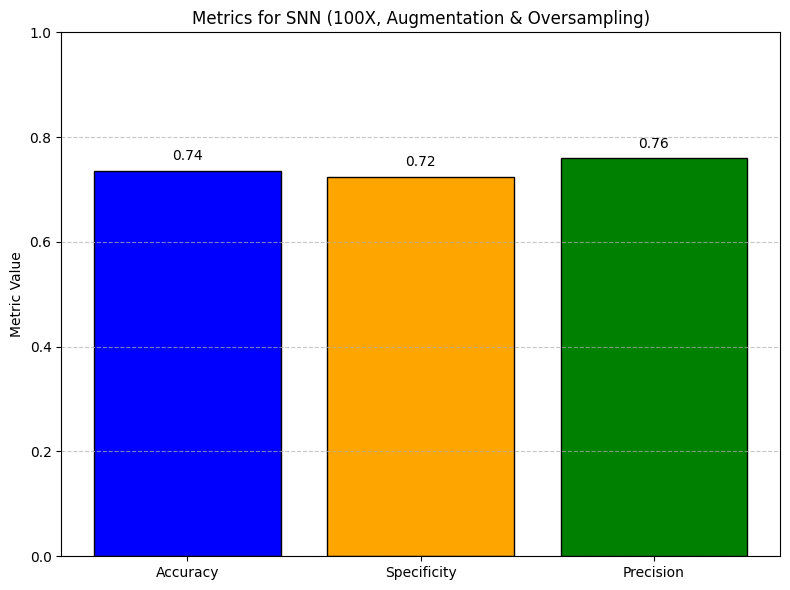

In [ ]:
# Calculate metrics
chosen_threshold = 0.5
y_pred_binary_snn_100x = (preds_snn_100x[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_snn_100x, y_pred_binary_snn_100x).ravel()

# Compute metrics
accuracy_snn_100x = (tp + tn) / (tp + tn + fp + fn)
specificity_snn_100x = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_snn_100x = tp / (tp + fp) if (tp + fp) > 0 else 0

# Prepare data for the bar chart
metrics = ['Accuracy', 'Specificity', 'Precision']
values = [accuracy_snn_100x, specificity_snn_100x, precision_snn_100x]

# Plot the bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics, values, color=['blue', 'orange', 'green'], edgecolor="black")
plt.ylim(0, 1)
plt.ylabel("Metric Value")
plt.title("Metrics for SNN (100X, Augmentation & Oversampling)")

# Add numeric values on top of bars
for i, v in enumerate(values):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center', fontsize=10)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


True Label: benign (Index: TensorCategory(0))
Predicted Label: benign (Index: 0)
Probabilities:
  benign: 0.5648
  malignant: 0.4352


<Axes: title={'center': 'True: benign | Predicted: benign'}>

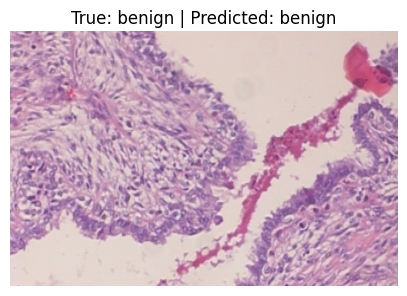

In [ ]:
# Get a sample image and its true label from the validation dataset
img, true_label = dls_oversampled_augmented_100x.valid_ds[0]

# Make a prediction
prediction_snn_100x = c2_snn_100x.predict(img)

# Extract prediction details
predicted_label_snn_100x = prediction_snn_100x[0]  # Predicted class label
predicted_index_snn_100x = prediction_snn_100x[1]  # Index of the predicted class
probabilities_snn_100x = prediction_snn_100x[2]    # Probabilities for each class

# Map the true label index to its string representation
true_label_str = dls_oversampled_augmented_100x.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label_snn_100x} (Index: {predicted_index_snn_100x.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities_snn_100x):
    label = dls_oversampled_augmented_100x.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with the prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label_snn_100x}")


100x VGG16 Augmented and Classimbalance implemented

In [ ]:
from torchvision.models import vgg16
import torch.nn as nn

# Define the VGG16 model
class VGG16FineTuned(nn.Module):
    def __init__(self):
        super(VGG16FineTuned, self).__init__()
        self.vgg16 = vgg16(pretrained=True)

        # Modify the classifier for binary classification
        self.vgg16.classifier[6] = nn.Linear(4096, 2)

    def forward(self, x):
        return self.vgg16(x)

# Initialize the VGG16 model
model_vgg_100x = VGG16FineTuned()

# Define the learner
c4_vgg_100x = Learner(
    dls_oversampled_augmented_100x,  # Use oversampled and augmented DataLoaders
    model=model_vgg_100x,
    loss_func=CrossEntropyLossFlat(),
    metrics=[accuracy, Precision(average='micro'), Recall(average='micro')]
)

# Train the VGG16 model
c4_vgg_100x.fit_one_cycle(10, lr_max=1e-4)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,accuracy,precision_score,recall_score,time
0,0.575779,0.396576,0.826193,0.826193,0.826193,00:12
1,0.425968,0.245530,0.898409,0.898409,0.898409,00:12
2,0.332833,0.163044,0.947368,0.947368,0.947368,00:11
3,0.290101,0.133191,0.954712,0.954712,0.954712,00:11
4,0.203674,0.149044,0.947368,0.947368,0.947368,00:11
5,0.145265,0.073298,0.974296,0.974296,0.974296,00:11
6,0.124567,0.128671,0.954712,0.954712,0.954712,00:11
7,0.086230,0.055006,0.980416,0.980416,0.980416,00:11
8,0.058141,0.035725,0.987760,0.987760,0.987760,00:11
9,0.043321,0.035611,0.987760,0.987760,0.987760,00:11


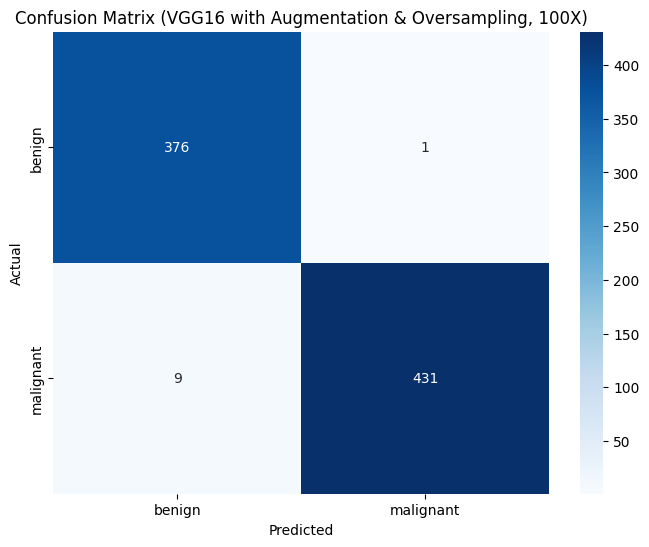

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Generate predictions
preds_vgg_100x, y_true_vgg_100x = c4_vgg_100x.get_preds()

# Confusion matrix
y_pred_vgg_100x = preds_vgg_100x.argmax(dim=1).numpy()
y_true_vgg_100x = y_true_vgg_100x.numpy()
cm_vgg_100x = confusion_matrix(y_true_vgg_100x, y_pred_vgg_100x)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm_vgg_100x, annot=True, fmt='d', cmap='Blues', xticklabels=dls_oversampled_augmented_100x.vocab, yticklabels=dls_oversampled_augmented_100x.vocab)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (VGG16 with Augmentation & Oversampling, 100X)')
plt.show()


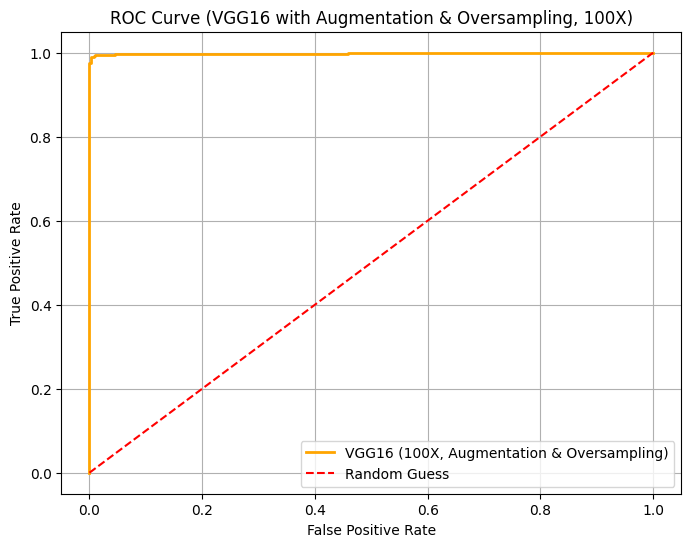

In [ ]:
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr_vgg_100x, tpr_vgg_100x, _ = roc_curve(y_true_vgg_100x, preds_vgg_100x[:, 1].numpy())

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr_vgg_100x, tpr_vgg_100x, label="VGG16 (100X, Augmentation & Oversampling)", color='orange', linewidth=2)
plt.plot([0, 1], [0, 1], color='red', linestyle='--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (VGG16 with Augmentation & Oversampling, 100X)")
plt.legend()
plt.grid()
plt.show()


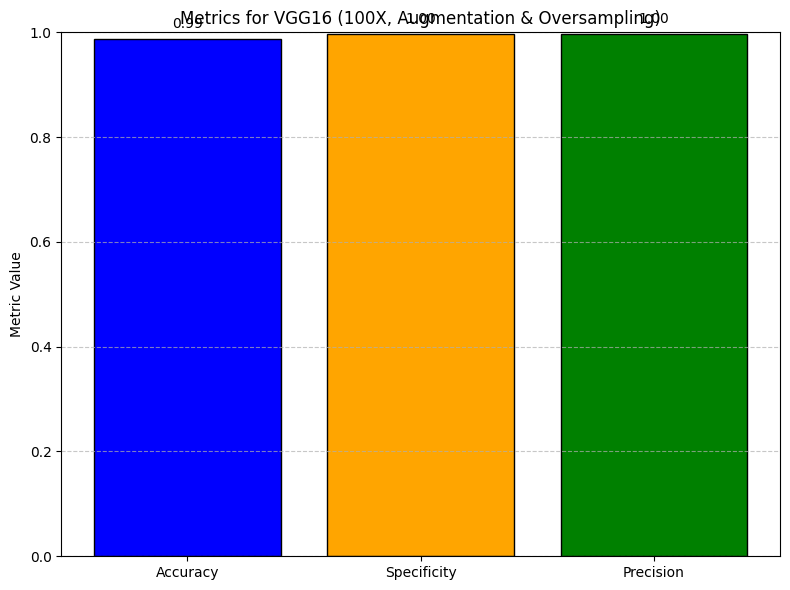

In [ ]:
# Calculate metrics
chosen_threshold = 0.5
y_pred_binary_vgg_100x = (preds_vgg_100x[:, 1] > chosen_threshold).int().numpy()
tn, fp, fn, tp = confusion_matrix(y_true_vgg_100x, y_pred_binary_vgg_100x).ravel()

# Compute metrics
accuracy_vgg_100x = (tp + tn) / (tp + tn + fp + fn)
specificity_vgg_100x = tn / (tn + fp) if (tn + fp) > 0 else 0
precision_vgg_100x = tp / (tp + fp) if (tp + fp) > 0 else 0

# Prepare data for the bar chart
metrics = ['Accuracy', 'Specificity', 'Precision']
values = [accuracy_vgg_100x, specificity_vgg_100x, precision_vgg_100x]

# Plot the bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics, values, color=['blue', 'orange', 'green'], edgecolor="black")
plt.ylim(0, 1)
plt.ylabel("Metric Value")
plt.title("Metrics for VGG16 (100X, Augmentation & Oversampling)")

# Add numeric values on top of bars
for i, v in enumerate(values):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center', fontsize=10)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


True Label: benign (Index: TensorCategory(0))
Predicted Label: benign (Index: 0)
Probabilities:
  benign: 0.9999
  malignant: 0.0001


<Axes: title={'center': 'True: benign | Predicted: benign'}>

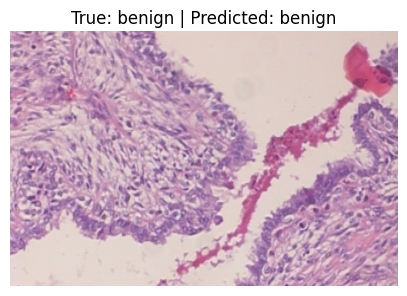

In [ ]:
# Get a sample image and its true label from the validation dataset
img, true_label = dls_oversampled_augmented_100x.valid_ds[0]

# Make a prediction
prediction_vgg_100x = c4_vgg_100x.predict(img)

# Extract prediction details
predicted_label_vgg_100x = prediction_vgg_100x[0]  # Predicted class label
predicted_index_vgg_100x = prediction_vgg_100x[1]  # Index of the predicted class
probabilities_vgg_100x = prediction_vgg_100x[2]    # Probabilities for each class

# Map the true label index to its string representation
true_label_str = dls_oversampled_augmented_100x.vocab[true_label]

# Print results
print(f"True Label: {true_label_str} (Index: {true_label})")
print(f"Predicted Label: {predicted_label_vgg_100x} (Index: {predicted_index_vgg_100x.item()})")
print("Probabilities:")
for idx, prob in enumerate(probabilities_vgg_100x):
    label = dls_oversampled_augmented_100x.vocab[idx]
    print(f"  {label}: {prob:.4f}")

# Display the image with the prediction and true label
img.show(title=f"True: {true_label_str} | Predicted: {predicted_label_vgg_100x}")


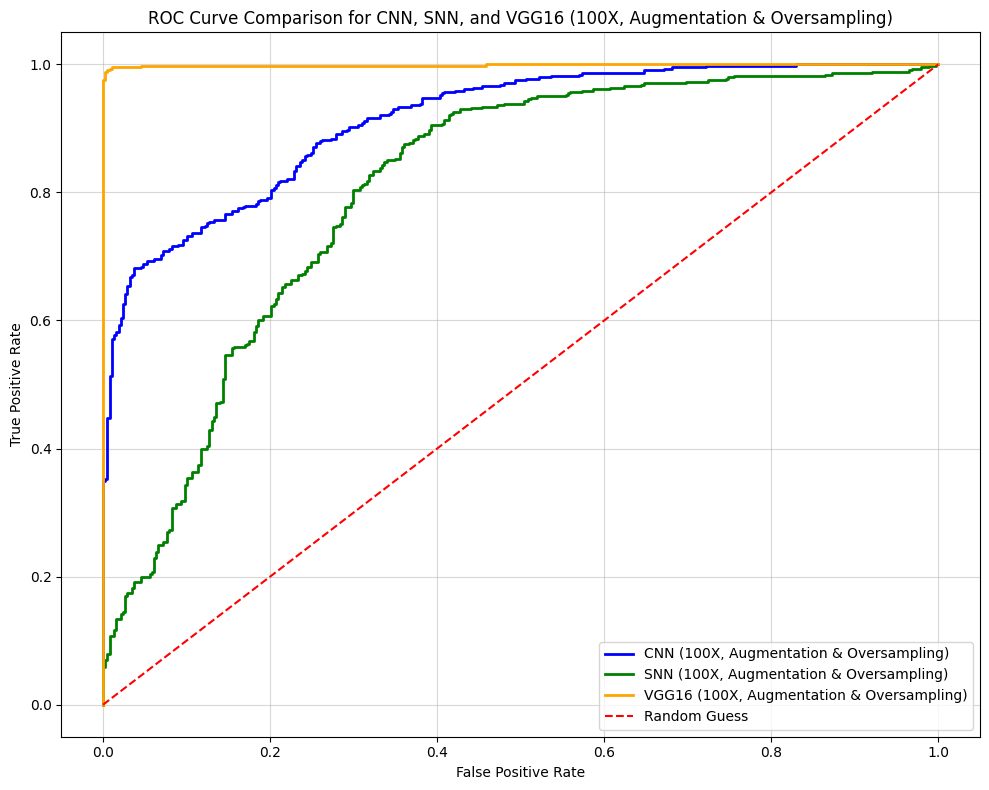

In [ ]:
from sklearn.metrics import roc_curve
import matplotlib.pyplot as plt

# Compute ROC curves for each model
fpr_cnn_100x, tpr_cnn_100x, _ = roc_curve(y_true_cnn_100x, preds_cnn_100x[:, 1].numpy())
fpr_snn_100x, tpr_snn_100x, _ = roc_curve(y_true_snn_100x, preds_snn_100x[:, 1].numpy())
fpr_vgg_100x, tpr_vgg_100x, _ = roc_curve(y_true_vgg_100x, preds_vgg_100x[:, 1].numpy())

# Plot ROC curves
plt.figure(figsize=(10, 8))

# CNN ROC Curve
plt.plot(fpr_cnn_100x, tpr_cnn_100x, label="CNN (100X, Augmentation & Oversampling)", color="blue", linewidth=2)
# SNN ROC Curve
plt.plot(fpr_snn_100x, tpr_snn_100x, label="SNN (100X, Augmentation & Oversampling)", color="green", linewidth=2)
# VGG16 ROC Curve
plt.plot(fpr_vgg_100x, tpr_vgg_100x, label="VGG16 (100X, Augmentation & Oversampling)", color="orange", linewidth=2)

# Random guess diagonal line
plt.plot([0, 1], [0, 1], color="red", linestyle="--", label="Random Guess")

# Customize the plot
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve Comparison for CNN, SNN, and VGG16 (100X, Augmentation & Oversampling)")
plt.legend(loc="lower right")
plt.grid(alpha=0.5)

# Show the plot
plt.tight_layout()
plt.show()


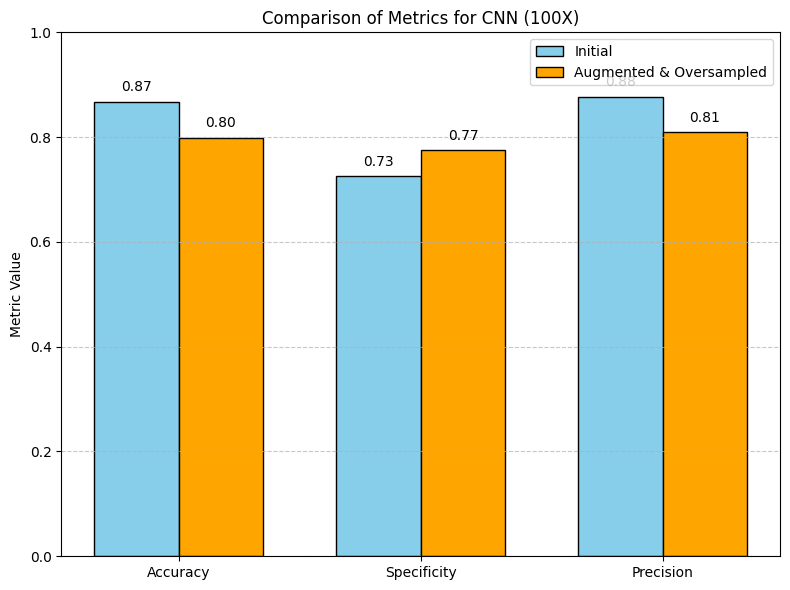

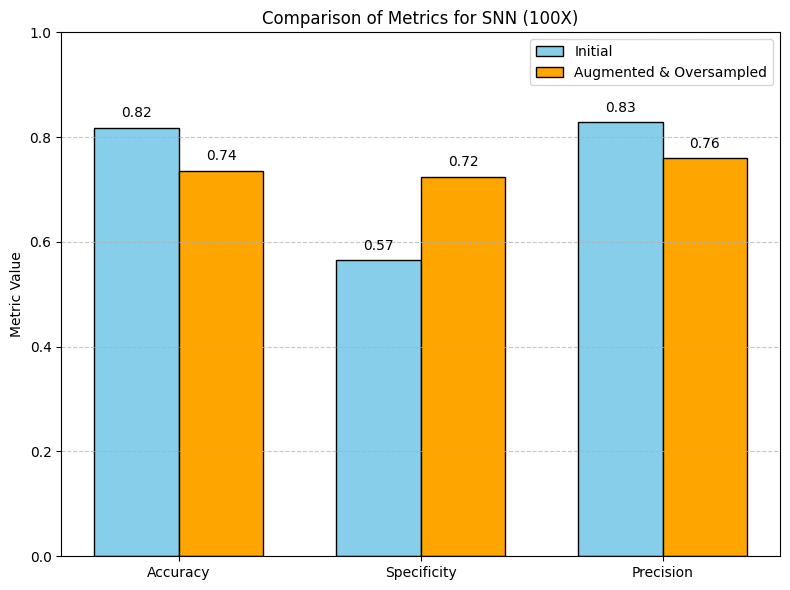

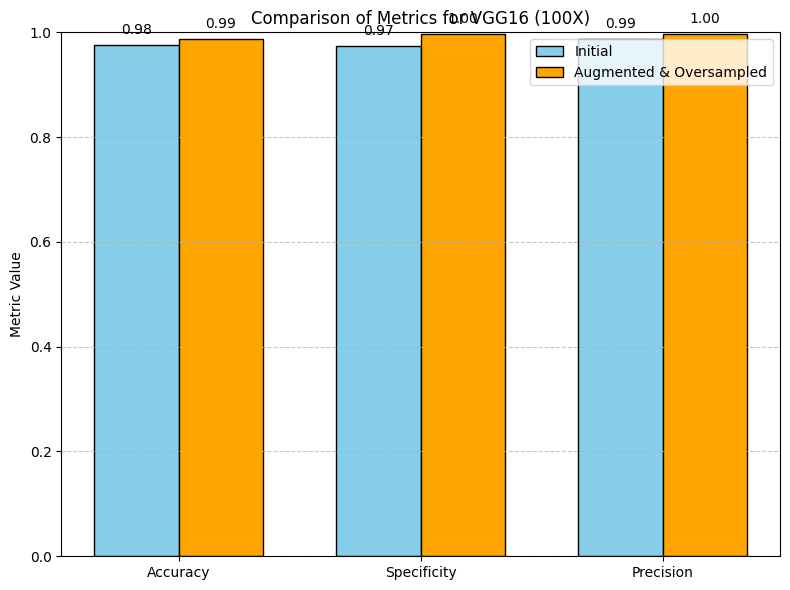

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to plot a comparison bar chart for a model
def plot_comparison_chart(model_name, metrics_initial, metrics_augmented):
    metrics = ['Accuracy', 'Specificity', 'Precision']
    x = np.arange(len(metrics))  # Metric indices
    width = 0.35  # Width of each bar

    # Plot the bar chart
    plt.figure(figsize=(8, 6))
    plt.bar(x - width/2, metrics_initial, width, label="Initial", color='skyblue', edgecolor="black")
    plt.bar(x + width/2, metrics_augmented, width, label="Augmented & Oversampled", color='orange', edgecolor="black")

    # Add numeric values on top of bars
    for i, v in enumerate(metrics_initial):
        plt.text(i - width/2, v + 0.02, f"{v:.2f}", ha='center', fontsize=10)
    for i, v in enumerate(metrics_augmented):
        plt.text(i + width/2, v + 0.02, f"{v:.2f}", ha='center', fontsize=10)

    # Customize the chart
    plt.xticks(x, metrics)
    plt.ylim(0, 1)
    plt.ylabel("Metric Value")
    plt.title(f"Comparison of Metrics for {model_name}")
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# CNN Comparison
plot_comparison_chart(
    "CNN (100X)",
    [accuracy_cnn_before, specificity_cnn_before, precision_cnn_before],
    [accuracy_cnn_100x, specificity_cnn_100x, precision_cnn_100x]
)

# SNN Comparison
plot_comparison_chart(
    "SNN (100X)",
    [accuracy_snn_before, specificity_snn_before, precision_snn_before],
    [accuracy_snn_100x, specificity_snn_100x, precision_snn_100x]
)

# VGG16 Comparison
plot_comparison_chart(
    "VGG16 (100X)",
    [accuracy_vgg_before, specificity_vgg_before, precision_vgg_before],
    [accuracy_vgg_100x, specificity_vgg_100x, precision_vgg_100x]
)
